# Taller de movilidad urbana: taxis y clima en Nueva York

**Caso de estudio:** viajes de NYC TLC Yellow Taxi durante enero de 2024.

En este taller construiremos un flujo reproducible: adquisición, inspección, auditoría de calidad, enriquecimiento por zonas, agregación temporal, integración con clima y análisis exploratorio. No buscamos demostrar causalidad, sino aprender a formular y comprobar preguntas con datos reales.

## Objetivos

Al finalizar podrás:

- construir y validar una URL de datos abiertos;
- inspeccionar estructura, tipos y faltantes antes de analizar;
- convertir reglas de calidad en una tabla de auditoría;
- enriquecer viajes mediante uniones `many_to_one`;
- agregar pickups por zona y hora sin sesgar la serie temporal;
- convertir observaciones meteorológicas de UTC a `America/New_York`;
- comunicar patrones y límites de un análisis exploratorio.

> **Pregunta guía:** ¿cómo varían los pickups de Yellow Taxi por lugar y hora, y qué relación exploratoria muestran con temperatura y precipitación?

## Ficha de fuentes

| Fuente | Recurso usado | Papel en el taller |
|---|---|---|
| [NYC TLC Trip Record Data](https://www.nyc.gov/site/tlc/about/tlc-trip-record-data.page) | Yellow Taxi, enero de 2024 (`yellow_tripdata_2024-01.parquet`) | fecha/hora, zonas, distancia, pasajeros e importes de viajes reportados |
| NYC TLC | [Taxi Zone Lookup](https://d37ci6vzurychx.cloudfront.net/misc/taxi_zone_lookup.csv) | traduce `LocationID` a borough, zona y `service_zone` |
| NYC TLC | [Taxi Zone Shapefile](https://d37ci6vzurychx.cloudfront.net/misc/taxi_zones.zip) | geometrías para la extensión espacial opcional |
| [NOAA GHCNh](https://www.ncei.noaa.gov/products/global-historical-climatology-network-hourly) | estación `USW00094728`, año 2024 | observaciones de clima con marcas temporales UTC |

**Periodo común:** enero de 2024 en hora local de Nueva York. Los archivos se leen desde sus URL o desde un directorio temporal; este notebook no guarda datasets en el repositorio. Consulta la documentación y licencias de cada proveedor antes de reutilizar los datos.

## 1. Preparación y modo de ejecución

En Colab normalmente basta con ejecutar los imports. Si falta el motor Parquet, descomenta la instalación. La extensión espacial se instala solo si se desea ejecutar esa sección.

In [1]:
# Instalación opcional para Google Colab/Jupyter (descomentar si hace falta):
# %pip install -q pyarrow
# %pip install -q geopandas folium requests

from io import StringIO
import tempfile
from pathlib import Path
from urllib.request import urlopen

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display

pd.set_option("display.max_columns", 50)
plt.style.use("seaborn-v0_8-whitegrid")

In [2]:
# True: primera semana de enero; False: todo enero. No hay muestreo aleatorio.
# TP semana 3: False para analizar enero COMPLETO (consigna, sección 1, punto 2).
MODO_CLASE = False
INICIO_MES = pd.Timestamp("2024-01-01")
FIN_MES = pd.Timestamp("2024-02-01")
FIN_ANALISIS = pd.Timestamp("2024-01-08") if MODO_CLASE else FIN_MES
ZONA_HORARIA = "America/New_York"

print(f"Ventana: {INICIO_MES} hasta {FIN_ANALISIS} (fin no incluido)")

Ventana: 2024-01-01 00:00:00 hasta 2024-02-01 00:00:00 (fin no incluido)


`MODO_CLASE` limita la lectura mediante un filtro temporal de Parquet cuando el motor lo permite. La selección es una semana completa y determinista, no una muestra aleatoria: así preservamos horas consecutivas y el flujo de agregación. En modo completo, la misma lógica procesa todo enero.

## 2. URL validada y carga reproducible

In [3]:
def construir_url_tlc(tipo, anio, mes):
    """Construye una URL TLC válida para un tipo, año y mes."""
    prefijos = {
        "yellow": "yellow_tripdata",
        "green": "green_tripdata",
        "fhv": "fhv_tripdata",
        "fhvhv": "fhvhv_tripdata",
    }
    if tipo not in prefijos:
        opciones = ", ".join(prefijos)
        raise ValueError(f"tipo debe ser uno de: {opciones}")
    if isinstance(anio, bool) or not isinstance(anio, (int, np.integer)) or not 2009 <= anio <= 2100:
        raise ValueError("anio debe ser un entero entre 2009 y 2100")
    if isinstance(mes, bool) or not isinstance(mes, (int, np.integer)) or not 1 <= mes <= 12:
        raise ValueError("mes debe ser un entero entre 1 y 12")
    archivo = f"{prefijos[tipo]}_{anio}-{mes:02d}.parquet"
    return f"https://d37ci6vzurychx.cloudfront.net/trip-data/{archivo}"

URL_VIAJES = construir_url_tlc("yellow", 2024, 1)
URL_ZONAS = "https://d37ci6vzurychx.cloudfront.net/misc/taxi_zone_lookup.csv"
URL_GEOMETRIAS = "https://d37ci6vzurychx.cloudfront.net/misc/taxi_zones.zip"
URL_CLIMA = (
    "https://www.ncei.noaa.gov/oa/global-historical-climatology-network/"
    "hourly/access/by-year/2024/psv/GHCNh_USW00094728_2024.psv"
)
print(URL_VIAJES)

https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2024-01.parquet


In [4]:
COLUMNAS_VIAJES = [
    "tpep_pickup_datetime", "tpep_dropoff_datetime",
    "passenger_count", "trip_distance", "PULocationID",
    "DOLocationID", "fare_amount", "total_amount",
]
filtros = [
    ("tpep_pickup_datetime", ">=", INICIO_MES.to_pydatetime()),
    ("tpep_pickup_datetime", "<", FIN_ANALISIS.to_pydatetime()),
]

# PyArrow aplica el filtro por fecha al leer los grupos de filas compatibles.
viajes_originales = pd.read_parquet(
    URL_VIAJES, columns=COLUMNAS_VIAJES, filters=filtros, engine="pyarrow"
)
print(f"Viajes cargados: {len(viajes_originales):,}")

Viajes cargados: 2,964,606


### Pregunta breve

¿Por qué una semana consecutiva es preferible a una muestra aleatoria si queremos comparar horas y días? Escribe una hipótesis antes de continuar.

<details><summary>Ver respuesta orientativa</summary>Una muestra aleatoria puede dejar horas incompletas y alterar sus conteos. Una ventana consecutiva conserva el orden, los ciclos diarios y el denominador temporal, aunque no necesariamente representa el mes completo.</details>

## 3. Inspección antes de limpiar

No debemos decidir reglas sin conocer el esquema. Observa dimensiones, ejemplos, tipos y faltantes.

In [5]:
print("Shape:", viajes_originales.shape)
display(viajes_originales.head())
print("\nInfo:")
viajes_originales.info()
print("\nTipos:")
display(viajes_originales.dtypes.rename("dtype").to_frame())

faltantes = (
    viajes_originales.isna().sum().rename("n_faltantes").to_frame()
    .assign(porcentaje=lambda x: 100 * x["n_faltantes"] / len(viajes_originales))
    .sort_values("porcentaje", ascending=False)
)
display(faltantes)

Shape: (2964606, 8)


,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,PULocationID,DOLocationID,fare_amount,total_amount
0,2024-01-01 00:57:55,2024-01-01 01:17:43,1.0,1.72,186,79,17.7,22.70
1,2024-01-01 00:03:00,2024-01-01 00:09:36,1.0,1.80,140,236,10.0,18.75
2,2024-01-01 00:17:06,2024-01-01 00:35:01,1.0,4.70,236,79,23.3,31.30
3,2024-01-01 00:36:38,2024-01-01 00:44:56,1.0,1.40,79,211,10.0,17.00
4,2024-01-01 00:46:51,2024-01-01 00:52:57,1.0,0.80,211,148,7.9,16.10



Info:
<class 'pandas.DataFrame'>
RangeIndex: 2964606 entries, 0 to 2964605
Data columns (total 8 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   tpep_pickup_datetime   datetime64[us]
 1   tpep_dropoff_datetime  datetime64[us]
 2   passenger_count        float64       
 3   trip_distance          float64       
 4   PULocationID           int32         
 5   DOLocationID           int32         
 6   fare_amount            float64       
 7   total_amount           float64       
dtypes: datetime64[us](2), float64(4), int32(2)
memory usage: 158.3 MB

Tipos:


,dtype
tpep_pickup_datetime,datetime64[us]
tpep_dropoff_datetime,datetime64[us]
passenger_count,float64
trip_distance,float64
PULocationID,int32
DOLocationID,int32
fare_amount,float64
total_amount,float64


,n_faltantes,porcentaje
passenger_count,140162,4.727846
tpep_pickup_datetime,0,0.000000
tpep_dropoff_datetime,0,0.000000
trip_distance,0,0.000000
PULocationID,0,0.000000
DOLocationID,0,0.000000
fare_amount,0,0.000000
total_amount,0,0.000000


**Observa:** `passenger_count` puede faltar por la forma de reporte. Su ausencia se conserva y no invalida automáticamente un viaje. Solo marcaremos como problemáticos los valores presentes fuera de un intervalo operativo razonable.

## 4. Calidad y auditoría

Las reglas siguientes son criterios analíticos, no verdades universales. Distancia máxima de 100 millas, hasta 8 pasajeros e importes menores a USD 1,000 son umbrales conservadores para detectar registros extremos o inválidos. Cada regla queda en una columna booleana.

In [6]:
calidad = viajes_originales.copy()
calidad["duracion_min"] = (
    calidad["tpep_dropoff_datetime"] - calidad["tpep_pickup_datetime"]
).dt.total_seconds() / 60

calidad["ok_pickup"] = calidad["tpep_pickup_datetime"].notna() & calidad["tpep_pickup_datetime"].between(INICIO_MES, FIN_ANALISIS, inclusive="left")
calidad["ok_dropoff"] = calidad["tpep_dropoff_datetime"].notna()
calidad["ok_duracion"] = calidad["duracion_min"].gt(0) & calidad["duracion_min"].le(24 * 60)
calidad["ok_distancia"] = calidad["trip_distance"].between(0, 100, inclusive="both")
calidad["ok_id_pickup_presente"] = calidad["PULocationID"].notna()
calidad["ok_id_dropoff_presente"] = calidad["DOLocationID"].notna()
calidad["ok_importes"] = (
    calidad["fare_amount"].between(0, 1_000, inclusive="both")
    & calidad["total_amount"].between(0, 1_000, inclusive="both")
    & calidad["total_amount"].ge(calidad["fare_amount"])
)
calidad["ok_pasajeros"] = calidad["passenger_count"].isna() | calidad["passenger_count"].between(0, 8, inclusive="both")

REGLAS = [c for c in calidad.columns if c.startswith("ok_")]
calidad["registro_valido"] = calidad[REGLAS].all(axis=1)
auditoria = pd.DataFrame({
    "regla": REGLAS,
    "cumplen": [int(calidad[c].sum()) for c in REGLAS],
    "incumplen": [int((~calidad[c]).sum()) for c in REGLAS],
})
auditoria["porcentaje_incumple"] = 100 * auditoria["incumplen"] / len(calidad)
display(auditoria.sort_values("porcentaje_incumple", ascending=False))

,regla,cumplen,incumplen,porcentaje_incumple
6,ok_importes,2927032,37574,1.267420
2,ok_duracion,2963720,886,0.029886
3,ok_distancia,2964547,59,0.001990
7,ok_pasajeros,2964605,1,0.000034
0,ok_pickup,2964606,0,0.000000
1,ok_dropoff,2964606,0,0.000000
5,ok_id_dropoff_presente,2964606,0,0.000000
4,ok_id_pickup_presente,2964606,0,0.000000


In [7]:
# Se mantienen por separado para no borrar silenciosamente información.
viajes_rechazados = calidad.loc[~calidad["registro_valido"]].copy()
viajes_validos = calidad.loc[calidad["registro_valido"]].copy()
print(f"Válidos: {len(viajes_validos):,} | Rechazados: {len(viajes_rechazados):,}")
display(viajes_rechazados[COLUMNAS_VIAJES + ["duracion_min"] + REGLAS].head())

Válidos: 2,926,101 | Rechazados: 38,505


,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,PULocationID,DOLocationID,fare_amount,total_amount,duracion_min,ok_pickup,ok_dropoff,ok_duracion,ok_distancia,ok_id_pickup_presente,ok_id_dropoff_presente,ok_importes,ok_pasajeros
23,2024-01-01 00:14:29,2024-01-01 00:14:29,1.0,0.00,236,264,3.0,8.00,0.000000,True,True,False,True,True,True,True,True
99,2024-01-01 00:18:24,2024-01-01 00:30:39,1.0,2.16,249,232,-13.5,-18.50,12.250000,True,True,True,True,True,True,False,True
504,2024-01-01 00:04:00,2024-01-01 00:04:44,1.0,0.01,63,63,-31.5,-34.25,0.733333,True,True,True,True,True,True,False,True
534,2024-01-01 00:41:42,2024-01-01 00:46:00,1.0,0.47,249,113,-5.8,-10.80,4.300000,True,True,True,True,True,True,False,True
550,2024-01-01 00:42:02,2024-01-01 01:14:33,1.0,5.48,107,61,-33.1,-38.10,32.516667,True,True,True,True,True,True,False,True


### Ejercicio 1: sensibilidad de una regla

Calcula cuántos viajes quedarían fuera si la distancia máxima fuese 50 millas, sin modificar `viajes_validos`.

In [8]:
# Tu respuesta:
# fuera_con_umbral_50 = ...

<details><summary>Ver solución</summary>

```python
fuera_con_umbral_50 = (~calidad["trip_distance"].between(0, 50)).sum()
print(fuera_con_umbral_50)
```

Conviene comparar este resultado con `ok_distancia` y justificar el umbral con conocimiento del dominio.
</details>

## 5. Enriquecimiento con zonas

### Objetivo

La tabla de viajes identifica el origen mediante `PULocationID` y el destino mediante `DOLocationID`. Estos códigos son útiles para relacionar tablas, pero no permiten interpretar directamente dónde comenzó o terminó un viaje.

En esta sección agregaremos a cada viaje el nombre de la zona, el borough y la clasificación de servicio tanto del origen como del destino. Conceptualmente:

```text
PULocationID = 161
        ↓
pickup_zone = Midtown Center
pickup_borough = Manhattan
pickup_service_zone = Yellow Zone
```

El enriquecimiento no cambia la unidad de observación: cada fila continúa representando un viaje Yellow Taxi reportado. Solo agrega contexto geográfico a sus identificadores.

### 5.1. El catálogo de zonas

`taxi_zone_lookup.csv` es un **catálogo de correspondencias** publicado por NYC TLC. No contiene viajes: contiene una descripción por `LocationID`.

| Columna | Significado |
|---|---|
| `LocationID` | Identificador numérico de la zona TLC |
| `Borough` | Distrito amplio, como Manhattan, Queens o Brooklyn |
| `Zone` | Nombre específico de la zona TLC |
| `service_zone` | Clasificación operativa, como `Yellow Zone`, `Boro Zone` o `Airports` |

Para que el catálogo pueda representar el lado **uno** de una unión, `LocationID` debe ser único.

In [9]:
zonas = pd.read_csv(URL_ZONAS)
display(zonas.head())
print("Cantidad de zonas:", len(zonas))
print("LocationID es único:", zonas["LocationID"].is_unique)

if zonas["LocationID"].duplicated().any():
    raise ValueError("Taxi Zone Lookup contiene LocationID duplicados")

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone


Cantidad de zonas: 265
LocationID es único: True


### 5.2. Un catálogo, dos roles

Cada viaje consulta el mismo catálogo desde dos papeles diferentes:

```text
PULocationID → zona de origen o pickup
DOLocationID → zona de destino o dropoff
```

Por eso creamos `zonas_pickup` y `zonas_dropoff`. No son dos catálogos distintos ni duplican los viajes: son dos versiones del mismo catálogo con nombres que explicitan el rol de sus columnas.

| Origen | Destino |
|---|---|
| `pickup_zone` | `dropoff_zone` |
| `pickup_borough` | `dropoff_borough` |
| `pickup_service_zone` | `dropoff_service_zone` |

Renombrar antes de unir evita nombres ambiguos como `Zone_x` y `Zone_y`. `DataFrame.rename()` devuelve estas versiones adaptadas sin modificar `zonas`.

In [10]:
zonas_pickup = zonas.rename(columns={
    "LocationID": "PULocationID", "Borough": "pickup_borough",
    "Zone": "pickup_zone", "service_zone": "pickup_service_zone",
})
zonas_dropoff = zonas.rename(columns={
    "LocationID": "DOLocationID", "Borough": "dropoff_borough",
    "Zone": "dropoff_zone", "service_zone": "dropoff_service_zone",
})

display(zonas_pickup.head(2))
display(zonas_dropoff.head(2))

,PULocationID,pickup_borough,pickup_zone,pickup_service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone


,DOLocationID,dropoff_borough,dropoff_zone,dropoff_service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone


### 5.3. Cardinalidad `many_to_one`

La relación esperada es **muchos viajes → una descripción de zona**. Un mismo `PULocationID` o `DOLocationID` puede aparecer en miles de viajes, pero cada identificador debe aparecer como máximo una vez en el catálogo correspondiente.

`validate="many_to_one"` hace que pandas compruebe esta condición durante la unión. Si el catálogo tuviera dos filas para `LocationID = 161`, tres viajes con ese identificador producirían seis filas:

```text
3 viajes × 2 coincidencias en el catálogo = 6 filas
```

Esa multiplicación inflaría conteos, importes, promedios y mapas. La validación detiene el proceso con un error en lugar de producir silenciosamente un resultado incorrecto. También ayuda a detectar catálogos repetidos, mezcla de versiones o descripciones contradictorias para un mismo ID.

### 5.4. Dos uniones izquierdas

Primero agregamos los atributos del origen y después los del destino. `how="left"` conserva todos los viajes válidos. Si un ID no aparece en el catálogo, el viaje permanece y sus atributos geográficos quedan como `NaN`, lo que permite auditar la falta de correspondencia en vez de eliminarla silenciosamente.

In [11]:
viajes_zonas = (
    viajes_validos.merge(zonas_pickup, on="PULocationID", how="left", validate="many_to_one")
    .merge(zonas_dropoff, on="DOLocationID", how="left", validate="many_to_one")
)

### 5.5. Controles posteriores e interpretación

Después de unir comprobamos dos propiedades diferentes:

1. **Conservación de filas:** la cantidad de viajes no debe cambiar.
2. **Cobertura del catálogo:** contamos los viajes cuyo ID no encontró nombre de zona.

`many_to_one` no garantiza cobertura completa ni detecta viajes duplicados, IDs faltantes, nombres incorrectos en una fila única o el uso de la clave equivocada. Por eso se complementa con estos controles y con la revisión semántica de las columnas obtenidas.

In [12]:
assert len(viajes_zonas) == len(viajes_validos), "La unión cambió el número de viajes"

sin_nombre_pickup = viajes_zonas["pickup_zone"].isna().sum()
sin_nombre_dropoff = viajes_zonas["dropoff_zone"].isna().sum()
print("Viajes antes y después:", len(viajes_validos), len(viajes_zonas))
print("Sin zona pickup:", sin_nombre_pickup, "| Sin zona dropoff:", sin_nombre_dropoff)

COLUMNAS_ZONA = [
    "PULocationID", "pickup_borough", "pickup_zone", "pickup_service_zone",
    "DOLocationID", "dropoff_borough", "dropoff_zone", "dropoff_service_zone",
]
display(viajes_zonas[COLUMNAS_ZONA].head())

Viajes antes y después: 2926101 2926101
Sin zona pickup: 10177 | Sin zona dropoff: 15295


,PULocationID,pickup_borough,pickup_zone,pickup_service_zone,DOLocationID,dropoff_borough,dropoff_zone,dropoff_service_zone
0,186,Manhattan,Penn Station/Madison Sq West,Yellow Zone,79,Manhattan,East Village,Yellow Zone
1,140,Manhattan,Lenox Hill East,Yellow Zone,236,Manhattan,Upper East Side North,Yellow Zone
2,236,Manhattan,Upper East Side North,Yellow Zone,79,Manhattan,East Village,Yellow Zone
3,79,Manhattan,East Village,Yellow Zone,211,Manhattan,SoHo,Yellow Zone
4,211,Manhattan,SoHo,Yellow Zone,148,Manhattan,Lower East Side,Yellow Zone


### Resultado de la sección

Cada fila sigue representando un viaje, pero ahora permite interpretar tanto su origen como su destino. Las zonas son áreas geográficas agregadas definidas por TLC: no indican una dirección ni una coordenada exacta, y el enriquecimiento no agrega demanda total, solicitudes no atendidas ni vehículos disponibles.

### Pregunta breve

¿Qué ocurriría si `LocationID = 161` apareciera dos veces en el catálogo y no utilizáramos `validate="many_to_one"`?

<details><summary>Ver respuesta orientativa</summary>Cada viaje con ese identificador encontraría dos coincidencias y aparecería dos veces en el resultado. Los conteos y agregaciones posteriores quedarían inflados. Con `validate="many_to_one"`, pandas detecta que el lado del catálogo no es único y detiene la unión.</details>

## 6. Agregación zona-hora de pickups

Los timestamps TLC se interpretan como hora local. En enero de 2024 no hay transición de horario de verano, pero explicitar la zona horaria evita una unión ambigua con NOAA.

In [13]:
viajes_zonas["pickup_hora"] = (
    viajes_zonas["tpep_pickup_datetime"]
    .dt.tz_localize(ZONA_HORARIA, ambiguous="raise", nonexistent="raise")
    .dt.floor("h")
)
pickups_zona_hora = (
    viajes_zonas.groupby(
        ["pickup_hora", "PULocationID", "pickup_borough", "pickup_zone"],
        observed=True, dropna=False,
    )
    .size().rename("pickups").reset_index()
)
assert pickups_zona_hora.duplicated(["pickup_hora", "PULocationID"]).sum() == 0
display(pickups_zona_hora.head())

,pickup_hora,PULocationID,pickup_borough,pickup_zone,pickups
0,2024-01-01 00:00:00-05:00,4,Manhattan,Alphabet City,24
1,2024-01-01 00:00:00-05:00,7,Queens,Astoria,4
2,2024-01-01 00:00:00-05:00,9,Queens,Auburndale,1
3,2024-01-01 00:00:00-05:00,10,Queens,Baisley Park,6
4,2024-01-01 00:00:00-05:00,12,Manhattan,Battery Park,4


## 7. Clima: UTC, hora local y resumen horario

GHCNh puede contener varias observaciones dentro de una hora. Seleccionaremos variables numéricas, convertiremos valores no numéricos a faltantes y resumiremos a una fila por hora. Temperatura usa media; precipitación usa suma con `min_count=1` para no convertir una hora totalmente faltante en cero.

In [14]:
COLUMNAS_CLIMA = [
    "STATION", "Station_name", "DATE", "temperature",
    "relative_humidity", "wind_speed", "precipitation", "visibility",
]
with urlopen(URL_CLIMA) as respuesta:
    texto_clima = respuesta.read().decode("utf-8")
clima_bruto = pd.read_csv(StringIO(texto_clima), sep="|", usecols=COLUMNAS_CLIMA, low_memory=False)
assert clima_bruto["STATION"].astype(str).eq("USW00094728").all()
print("Observaciones meteorológicas cargadas:", len(clima_bruto))

Observaciones meteorológicas cargadas: 11222


In [15]:
clima = clima_bruto.copy()
clima["fecha_utc"] = pd.to_datetime(clima["DATE"], utc=True, errors="coerce")
clima["fecha_ny"] = clima["fecha_utc"].dt.tz_convert(ZONA_HORARIA)
inicio_local = INICIO_MES.tz_localize(ZONA_HORARIA)
fin_local = FIN_ANALISIS.tz_localize(ZONA_HORARIA)
clima = clima.loc[clima["fecha_ny"].between(inicio_local, fin_local, inclusive="left")].copy()

VARIABLES_CLIMA = ["temperature", "relative_humidity", "wind_speed", "precipitation", "visibility"]
clima[VARIABLES_CLIMA] = clima[VARIABLES_CLIMA].apply(pd.to_numeric, errors="coerce")
clima["hora"] = clima["fecha_ny"].dt.floor("h")
clima_horario = (
    clima.groupby("hora", as_index=False)
    .agg(
        temperatura_c=("temperature", "mean"),
        humedad_relativa=("relative_humidity", "mean"),
        viento=("wind_speed", "mean"),
        precipitacion_mm=("precipitation", lambda s: s.sum(min_count=1)),
        visibilidad=("visibility", "mean"),
        observaciones=("fecha_ny", "size"),
    )
)
if clima_horario["hora"].duplicated().any():
    raise ValueError("El resumen climático no es único por hora")
display(clima_horario.head())

,hora,temperatura_c,humedad_relativa,viento,precipitacion_mm,visibilidad,observaciones
0,2024-01-01 00:00:00-05:00,5.6,55.0,3.1,0.0,16.093,1
1,2024-01-01 01:00:00-05:00,5.6,58.0,2.1,0.0,16.093,1
2,2024-01-01 02:00:00-05:00,5.0,60.0,0.0,0.0,16.093,1
3,2024-01-01 03:00:00-05:00,5.0,62.0,1.5,0.0,16.093,1
4,2024-01-01 04:00:00-05:00,4.4,68.0,0.0,0.0,16.093,1


### Ejercicio 2: cobertura temporal

Compara las horas esperadas de la ventana con las horas observadas en `clima_horario`. ¿Hay huecos?

In [16]:
# Tu respuesta:
# horas_esperadas = ...
# horas_sin_clima = ...

<details><summary>Ver solución</summary>

```python
horas_esperadas = pd.date_range(inicio_local, fin_local, freq="h", inclusive="left")
horas_sin_clima = horas_esperadas.difference(clima_horario["hora"])
print("Horas esperadas:", len(horas_esperadas))
print("Horas sin observación:", len(horas_sin_clima))
display(horas_sin_clima[:10])
```
</details>

## 8. Unión zona-hora con clima

Cada fila zona-hora debe encontrar como máximo una fila climática. La unión izquierda conserva los pickups aunque el clima falte.

In [17]:
zona_hora_clima = pickups_zona_hora.merge(
    clima_horario, left_on="pickup_hora", right_on="hora",
    how="left", validate="many_to_one", indicator=True,
)
assert len(zona_hora_clima) == len(pickups_zona_hora), "La unión alteró la cardinalidad izquierda"
auditoria_union = zona_hora_clima["_merge"].value_counts(dropna=False).rename_axis("resultado").to_frame("filas")
display(auditoria_union)
zona_hora_clima = zona_hora_clima.drop(columns="_merge")

,filas
resultado,
both,77335
left_only,131
right_only,0


### ¿Por qué el clima queda repetido por zona?

La unidad de `zona_hora_clima` es **una zona en una hora**. En cambio, `clima_horario` contiene una sola observación por hora. Cuando esa observación se une con varias zonas de la misma hora, pandas la copia en cada fila zona-hora.

Ejemplo conceptual:

| zona | hora | pickups | temperatura |
|---|---|---:|---:|
| A | 08:00 | 20 | 5 °C |
| B | 08:00 | 35 | 5 °C |
| C | 08:00 | 15 | 5 °C |

Los tres valores de `5 °C` no son mediciones diferentes: son la misma observación meteorológica replicada por la unión `many_to_one`. Esta repetición es intencional, no un duplicado accidental. Además, NOAA representa una estación meteorológica; no estamos estimando un clima diferente para cada zona.

## 9. Análisis exploratorio con pandas y matplotlib

Lee cada gráfico como evidencia descriptiva. Pregunta siempre: ¿qué unidad representa?, ¿qué filtros se aplicaron?, ¿qué explicación alternativa existe?

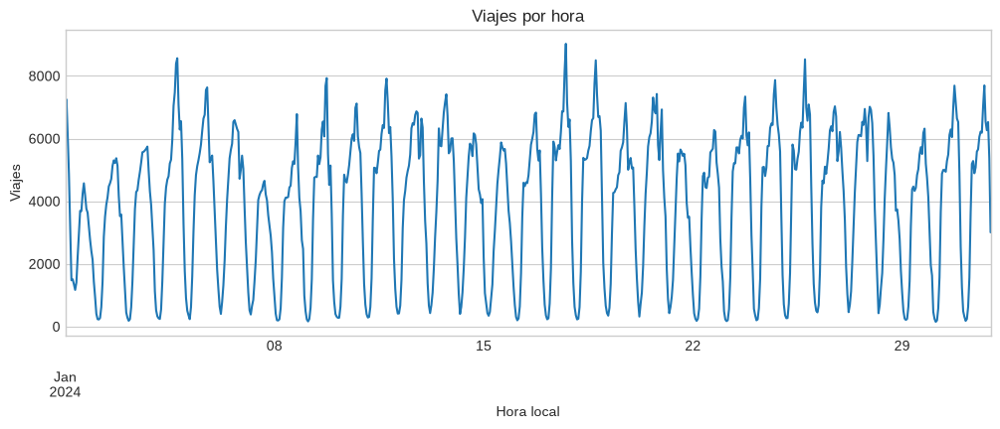

In [18]:
viajes_por_hora = viajes_zonas.set_index("pickup_hora").resample("h").size()
ax = viajes_por_hora.plot(figsize=(12, 4), color="#1f77b4", linewidth=1.5)
ax.set(title="Viajes por hora", xlabel="Hora local", ylabel="Viajes")
plt.show()

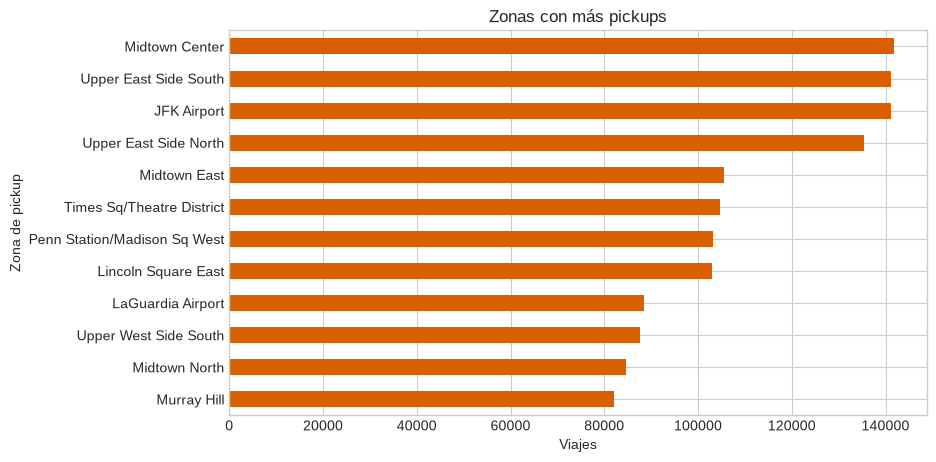

,pickups
pickup_zone,
Midtown Center,141714
Upper East Side South,141237
JFK Airport,141107
Upper East Side North,135303
Midtown East,105440
Times Sq/Theatre District,104590
Penn Station/Madison Sq West,103254
Lincoln Square East,102960
LaGuardia Airport,88556


In [19]:
top_zonas = viajes_zonas["pickup_zone"].value_counts().head(12).sort_values()
ax = top_zonas.plot.barh(figsize=(9, 5), color="#d95f02")
ax.set(title="Zonas con más pickups", xlabel="Viajes", ylabel="Zona de pickup")
plt.show()
display(top_zonas.sort_values(ascending=False).rename("pickups").to_frame())

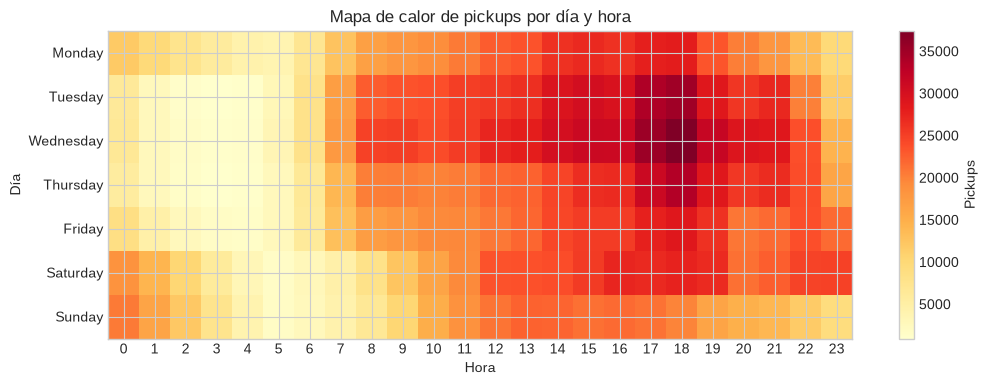

In [20]:
patron = viajes_zonas.assign(
    dia=viajes_zonas["pickup_hora"].dt.day_name(),
    hora_dia=viajes_zonas["pickup_hora"].dt.hour,
).pivot_table(index="dia", columns="hora_dia", values="PULocationID", aggfunc="size", fill_value=0)
orden_dias = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
patron = patron.reindex([d for d in orden_dias if d in patron.index])
fig, ax = plt.subplots(figsize=(12, 4))
imagen = ax.imshow(patron, aspect="auto", cmap="YlOrRd")
ax.set(title="Mapa de calor de pickups por día y hora", xlabel="Hora", ylabel="Día")
ax.set_xticks(range(24), labels=range(24))
ax.set_yticks(range(len(patron.index)), labels=patron.index)
fig.colorbar(imagen, ax=ax, label="Pickups")
plt.show()

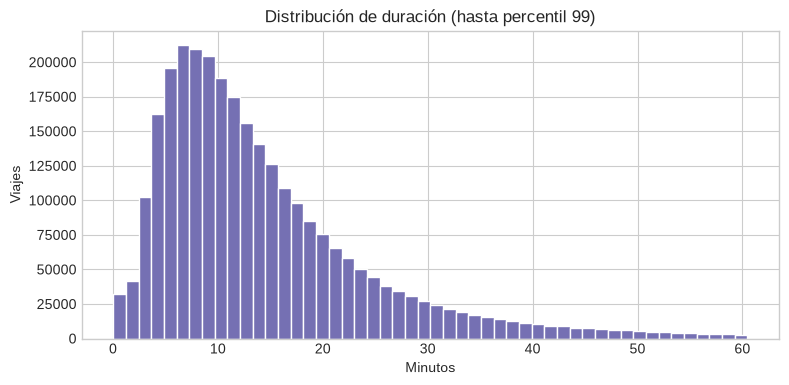

Percentil 99 mostrado: 60.5 minutos


In [21]:
limite_99 = viajes_validos["duracion_min"].quantile(0.99)
ax = viajes_validos.loc[viajes_validos["duracion_min"] <= limite_99, "duracion_min"].plot.hist(
    bins=50, figsize=(9, 4), color="#7570b3", edgecolor="white"
)
ax.set(title="Distribución de duración (hasta percentil 99)", xlabel="Minutos", ylabel="Viajes")
plt.show()
print("Percentil 99 mostrado:", round(limite_99, 1), "minutos")

### 9.1. De zona-hora a una observación por hora

Para comparar la actividad total de taxis con el clima debemos volver de la unidad **zona-hora** a la unidad **hora**. En el ejemplo anterior:

```text
pickups = 20 + 35 + 15 = 70
temperatura = 5 °C
```

Por eso usamos operaciones diferentes:

- `sum` para `pickups`, porque cada zona aporta viajes distintos;
- `first` para temperatura y precipitación, porque cada fila contiene una copia del mismo clima horario.

Sumar la temperatura produciría `5 + 5 + 5 = 15 °C`, un valor sin interpretación física. El uso de `first` requiere comprobar antes que una misma hora no contenga valores climáticos diferentes entre zonas.

Consistencia climática por hora: OK


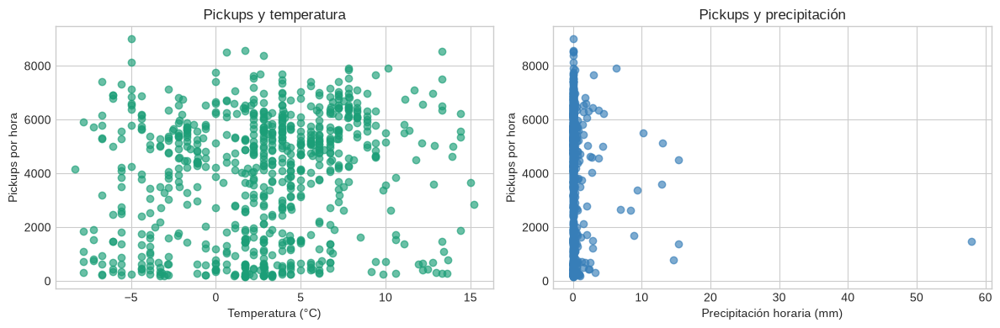

,pickups,temperatura_c,precipitacion_mm
pickups,1.000,0.158,-0.054
temperatura_c,0.158,1.000,0.193
precipitacion_mm,-0.054,0.193,1.000


In [22]:
# Verificamos el supuesto necesario para conservar una sola copia con 'first'.
variables_clima_repetidas = ["temperatura_c", "precipitacion_mm"]
consistencia_clima = (
    zona_hora_clima
    .groupby("pickup_hora")[variables_clima_repetidas]
    .nunique(dropna=False)
)
assert consistencia_clima.le(1).all().all(), (
    "Una misma hora contiene valores climáticos diferentes entre zonas"
)
print("Consistencia climática por hora: OK")

# El clima está repetido por zona; volvemos a una observación por hora.
comparacion_horaria = (
    zona_hora_clima.groupby("pickup_hora", as_index=False)
    .agg(
        pickups=("pickups", "sum"),
        temperatura_c=("temperatura_c", "first"),
        precipitacion_mm=("precipitacion_mm", "first"),
    )
)
assert not comparacion_horaria["pickup_hora"].duplicated().any()
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].scatter(comparacion_horaria["temperatura_c"], comparacion_horaria["pickups"], alpha=0.65, color="#1b9e77")
axes[0].set(xlabel="Temperatura (°C)", ylabel="Pickups por hora", title="Pickups y temperatura")
axes[1].scatter(comparacion_horaria["precipitacion_mm"], comparacion_horaria["pickups"], alpha=0.65, color="#377eb8")
axes[1].set(xlabel="Precipitación horaria (mm)", ylabel="Pickups por hora", title="Pickups y precipitación")
plt.tight_layout()
plt.show()
display(comparacion_horaria[["pickups", "temperatura_c", "precipitacion_mm"]].corr().round(3))

### Pregunta breve

¿Qué ocurriría si sumáramos la temperatura después de haberla replicado por zona?

<details><summary>Ver respuesta orientativa</summary>La misma observación se contabilizaría varias veces y produciría una temperatura sin interpretación física. Los pickups sí se suman porque cada zona aporta viajes diferentes; el clima se conserva una sola vez porque es el mismo valor replicado.</details>

### Ejercicio 3: interpretar sin exagerar

Escribe dos observaciones de los gráficos y una explicación alternativa. Evita frases causales como “la lluvia provoca...”.

**Tu respuesta:**

1. ...
2. ...
3. Explicación alternativa: ...

<details><summary>Ver pauta de solución</summary>Una respuesta sólida identifica dirección, magnitud o franjas horarias, menciona la ventana analizada y reconoce factores de confusión como hora pico, día de semana, aeropuerto, feriados o disponibilidad de taxis. Una correlación horaria no permite atribuir causalidad al clima.</details>

## 10. Exportar el producto fuera del repositorio

Antes de exportar comprobamos la clave, ordenamos el producto y usamos el directorio temporal del sistema. El nombre distingue el modo de clase del mes completo para no declarar una cobertura que no fue procesada.

In [23]:
producto = zona_hora_clima.sort_values(["pickup_hora", "PULocationID"]).copy()
if producto.duplicated(["pickup_hora", "PULocationID"]).any():
    raise ValueError("La clave zona-hora no es única")

alcance = "primera_semana_enero_2024" if MODO_CLASE else "enero_2024"
ruta_producto = Path(tempfile.gettempdir()) / f"zona_hora_{alcance}.parquet"
producto.to_parquet(ruta_producto, index=False)
print("Producto temporal:", ruta_producto)
print("Unidad: zona de origen-hora local | Zona horaria:", ZONA_HORARIA)

Producto temporal: /tmp/zona_hora_enero_2024.parquet
Unidad: zona de origen-hora local | Zona horaria: America/New_York


## 11. Extensión espacial opcional

Esta celda descarga el ZIP del shapefile a un directorio temporal, extrae juntos sus componentes (`.shp`, `.dbf`, `.shx`, `.prj`) y construye un mapa Folium. La extracción explícita evita depender de que el backend geoespacial admita rutas virtuales `zip://`; al finalizar, el directorio temporal se elimina y no deja geometrías en el repositorio. Si `geopandas`, `folium` o `requests` no están instalados, informa exactamente cómo habilitar la sección y el resto del taller sigue siendo utilizable.

In [24]:
try:
    import folium
    import geopandas as gpd
    import requests
    import zipfile
except ModuleNotFoundError as error:
    print(
        f"Sección espacial omitida: falta '{error.name}'. "
        "Descomenta `%pip install -q geopandas folium requests`, reinicia si es necesario y vuelve a ejecutar."
    )
else:
    with tempfile.TemporaryDirectory() as directorio_base:
        ruta_zip = Path(directorio_base) / "taxi_zones.zip"
        respuesta = requests.get(URL_GEOMETRIAS, timeout=60)
        respuesta.raise_for_status()
        ruta_zip.write_bytes(respuesta.content)
        if not zipfile.is_zipfile(ruta_zip):
            raise zipfile.BadZipFile("La descarga de zonas TLC no es un archivo ZIP válido")

        directorio_extraido = Path(directorio_base) / "taxi_zones_extraido"
        directorio_extraido.mkdir()
        with zipfile.ZipFile(ruta_zip) as archivo_zip:
            archivo_zip.extractall(directorio_extraido)

        archivos_shp = sorted(directorio_extraido.rglob("*.shp"))
        if not archivos_shp:
            raise FileNotFoundError("No se encontró un archivo .shp dentro del ZIP de zonas TLC")
        ruta_shp = next((ruta for ruta in archivos_shp if ruta.name == "taxi_zones.shp"), archivos_shp[0])
        geo_zonas = gpd.read_file(ruta_shp).to_crs(epsg=4326)

    pickups_mapa = viajes_zonas["PULocationID"].value_counts().rename("pickups").reset_index()
    geo_zonas["LocationID"] = pd.to_numeric(geo_zonas["LocationID"])
    geo_mapa = geo_zonas.merge(pickups_mapa, left_on="LocationID", right_on="PULocationID", how="left", validate="one_to_one")
    geo_mapa["pickups"] = geo_mapa["pickups"].fillna(0)
    min_x, min_y, max_x, max_y = geo_mapa.total_bounds
    centro = [(min_y + max_y) / 2, (min_x + max_x) / 2]
    mapa = folium.Map(location=centro, zoom_start=10, tiles="CartoDB positron")
    folium.Choropleth(
        geo_data=geo_mapa, data=geo_mapa, columns=["LocationID", "pickups"],
        key_on="feature.properties.LocationID", fill_color="YlOrRd",
        fill_opacity=0.7, line_opacity=0.3, legend_name="Pickups",
    ).add_to(mapa)
    folium.GeoJson(
        geo_mapa, style_function=lambda _: {"fillOpacity": 0, "weight": 0},
        tooltip=folium.GeoJsonTooltip(fields=["zone", "borough", "pickups"], aliases=["Zona", "Borough", "Pickups"]),
    ).add_to(mapa)
    display(mapa)

## 12. Conclusiones y límites

**Qué construimos**

- un proceso reproducible para enero de 2024, escalable de una semana al mes;
- una auditoría que hace visibles los criterios de exclusión;
- una tabla zona-hora enriquecida con clima mediante cardinalidad comprobada;
- visualizaciones temporales, espaciales y de asociación exploratoria.

**Límites que deben acompañar cualquier conclusión**

- Los registros son **viajes reportados de Yellow Taxi**, no demanda total, viajes no atendidos ni toda la movilidad de Nueva York.
- Una sola estación, `USW00094728`, no representa toda la variación meteorológica espacial de la ciudad.
- La cobertura y frecuencia de GHCNh pueden variar; resumir precipitación subhoraria exige revisar la documentación de medición.
- Las reglas de calidad y sus umbrales afectan los resultados y deben justificarse.
- La asociación entre pickups y clima está confundida por hora, día, localización, oferta, eventos y otros factores. **Correlación no implica causalidad.**
- `MODO_CLASE=True` describe solo la primera semana; para conclusiones mensuales se debe ejecutar el mes completo y evaluar estabilidad.

**Cierre:** ¿qué dato adicional pedirías para distinguir mejor demanda, oferta y viajes efectivamente realizados?

---

# Trabajo práctico: exploración de dos variables

**Estudiante:** Bruno Fabián Capri — `bruno.fabian.capri.oficial@gmail.com`
**Curso:** Data Science — semana 3, clase 3 · **Modalidad:** individual
**Notebook base:** `Taller_Clase_02_Movilidad.ipynb` (copia personal; el original de la clase no se modifica)
**Periodo:** enero de 2024 completo, `[2024-01-01, 2024-02-01)` en `America/New_York`

## Par elegido (declarado antes de mirar ningún resultado)

| | |
|---|---|
| **Código** | **CM-01** |
| **Columna 1** | `temperatura_c` |
| **Columna 2** | `humedad_relativa` |
| **Vista analítica obligatoria** | **H — horaria** (una fila por hora local de enero) |

Esta elección queda fijada acá y se sostiene durante todo el trabajo: no se cambia de par, de vista ni de enfoque más adelante en función de qué resultado quede más prolijo.

### Cambios realizados sobre el notebook base

1. `MODO_CLASE` pasó de `True` a `False` (celda de la sección 1), de modo que la ventana de análisis es el mes completo y no la primera semana.
2. Se agregó esta sección al final. **No se modificó** ninguna otra cosa: ni el periodo, ni las fuentes, ni las reglas de calidad, ni los umbrales de la auditoría. Todo lo que sigue se apoya en la tabla `producto` construida por el notebook base tal como está.

`precipitacion_mm` no se usa en ningún punto de este trabajo (columna descartada por consigna, sección 4).


In [25]:
# ---------------------------------------------------------------------------
# Verificación de preparación (sección 1 de la consigna).
# Se comprueba por código, no "a ojo", que el notebook corrió en las
# condiciones que este trabajo necesita.
# ---------------------------------------------------------------------------
import textwrap

def lectura(titulo, texto):
    """Imprime una lectura interpretada del resultado inmediatamente anterior."""
    print("\n" + titulo)
    print("-" * len(titulo))
    for parrafo in texto.strip().split("\n"):
        print(textwrap.fill(parrafo.strip(), width=100))

assert MODO_CLASE is False, "MODO_CLASE debe ser False: con True se analiza solo la primera semana"
assert FIN_ANALISIS == FIN_MES == pd.Timestamp("2024-02-01"), "La ventana no llega al mes completo"
assert INICIO_MES == pd.Timestamp("2024-01-01")
assert ZONA_HORARIA == "America/New_York"

INICIO_LOCAL = INICIO_MES.tz_localize(ZONA_HORARIA)
FIN_LOCAL = FIN_ANALISIS.tz_localize(ZONA_HORARIA)

# La tabla producto debe existir, tener las columnas del par y clave única.
COLUMNAS_PAR = ["temperatura_c", "humedad_relativa"]
faltan = [c for c in COLUMNAS_PAR + ["pickup_hora", "PULocationID", "pickups"] if c not in producto.columns]
assert not faltan, f"Faltan columnas en producto: {faltan}"
assert not producto.duplicated(["pickup_hora", "PULocationID"]).any(), "La clave zona-hora no es única"

print("Ventana de análisis :", INICIO_LOCAL, "->", FIN_LOCAL, "(fin no incluido)")
print("Zona horaria        :", ZONA_HORARIA)
print("producto            :", producto.shape[0], "filas x", producto.shape[1], "columnas")
print("Unidad de producto  : una zona de origen con >=1 pickup registrado durante una hora local")
print("Clave               : (pickup_hora, PULocationID) -> única: OK")
print("Rango de pickup_hora:", producto["pickup_hora"].min(), "->", producto["pickup_hora"].max())
print("Estación NOAA       :", clima_bruto["Station_name"].dropna().unique()[:3],
      "| ID:", clima_bruto["STATION"].unique()[:3])


Ventana de análisis : 2024-01-01 00:00:00-05:00 -> 2024-02-01 00:00:00-05:00 (fin no incluido)
Zona horaria        : America/New_York
producto            : 77466 filas x 12 columnas
Unidad de producto  : una zona de origen con >=1 pickup registrado durante una hora local
Clave               : (pickup_hora, PULocationID) -> única: OK
Rango de pickup_hora: 2024-01-01 00:00:00-05:00 -> 2024-01-31 23:00:00-05:00
Estación NOAA       : <ArrowStringArray>
['NY CITY CNTRL PARK']
Length: 1, dtype: str | ID: <ArrowStringArray>
['USW00094728']
Length: 1, dtype: str


## 5. Declaración previa del análisis

> Esta tabla se completa **antes** de calcular ninguna estadística. Su función es comprometer por escrito qué se va a medir, sobre qué población y con qué alcance, para no acomodar después el análisis al resultado que más convenga.

| Campo | Respuesta del estudiante |
|---|---|
| **Código y par elegido** | **CM-01** — `temperatura_c` (columna 1) y `humedad_relativa` (columna 2). |
| **Pregunta exploratoria** | ¿Cómo se distribuyen y cómo varían conjuntamente la temperatura del aire (°C) y la humedad relativa (%) registradas por la estación meteorológica NOAA `USW00094728`, durante las horas locales de enero de 2024 que aparecen en la tabla `producto` (es decir, las horas con al menos un pickup válido de Yellow Taxi)? |
| **Significado de la primera columna** | `temperatura_c`: temperatura del aire medida por la estación, en **grados Celsius**. En el producto ya viene resumida: es el **promedio** de las observaciones subhorarias GHCNh que caen dentro de cada hora local. |
| **Significado de la segunda columna** | `humedad_relativa`: humedad relativa del aire medida por la misma estación, en **porcentaje (%)**, definida como la proporción entre el vapor de agua presente y el máximo que el aire podría contener a esa temperatura. También viene resumida como **promedio** de las observaciones subhorarias de la hora. |
| **Tipo semántico de cada columna** | Ambas son **numéricas continuas**. `temperatura_c` está en escala de intervalo (el 0 °C es convencional, no un "cero absoluto": no tiene sentido decir que 20 °C es "el doble" de 10 °C). `humedad_relativa` es una proporción acotada por construcción al intervalo **[0, 100] %**. Ninguna de las dos es un identificador ni una categoría. |
| **Unidad analítica y vista** | **Vista H**: una fila = **una hora local de enero de 2024** presente en `producto`. Se llega a ella agregando `producto` por `pickup_hora` (`sum` para `pickups`, `first` para las variables NOAA, previa verificación de que son constantes dentro de la hora). |
| **Periodo y zona horaria** | `[2024-01-01 00:00, 2024-02-01 00:00)` en `America/New_York`. Intervalo cerrado a la izquierda y abierto a la derecha. Enero no tiene transición de horario de verano, así que las horas locales del mes son 744. |
| **Población registrada** | Observaciones de **una sola estación meteorológica** (NOAA GHCNh `USW00094728`), restringidas a las horas que quedaron representadas en `producto`. `producto` solo contiene horas en las que **al menos una zona tuvo un pickup de Yellow Taxi válido**: una hora sin ningún pickup registrado simplemente no aparece como fila. La población **no** es "el clima de Nueva York" ni "todas las horas del mes". |
| **Denominador o tamaño válido** | Horas presentes en la vista H (a reportar en 6.1) y, dentro de ellas, las que tienen valor **no nulo** en cada columna. Para el análisis bivariado el denominador es el número de horas con **ambas** columnas presentes (pares completos); se informa explícitamente y no se rellena ningún faltante. |
| **Afirmaciones que los datos no permiten** | (a) Cualquier afirmación **causal** entre temperatura y humedad: se observa una asociación, no un mecanismo identificado por este diseño. (b) Que el valor horario represente el clima **de cada zona o borough**: es una única estación, un solo punto de la ciudad. (c) Inferencia estadística que suponga **observaciones independientes**: las horas consecutivas están fuertemente correlacionadas entre sí. (d) Nada sobre **demanda de taxis**: los registros TLC son viajes realizados y reportados que además pasaron las reglas de calidad. (e) Extrapolar a otros meses o años: enero es un mes de invierno y el rango de temperaturas observado es acotado. |

### Análisis de sensibilidad, definido de antemano (sección 9)

Se fijan **antes** de ver ningún resultado, para que la elección no dependa de cuál de las alternativas resulte más llamativa:

- **Coeficiente — Pearson vs. Spearman.** Pearson mide relación lineal; Spearman, relación monotónica sobre los rangos y es menos sensible a valores extremos. Se reportan **los dos**, pase lo que pase.
- **Conjunto de horas — Con y sin los candidatos de Tukey.** Se recalculan los resúmenes univariados y las dos correlaciones excluyendo los casos señalados en la sección 7, **sin borrarlos** del conjunto de trabajo.
- **Estratificación — Por franja horaria del día** (madrugada 0–5, mañana 6–11, tarde 12–17, noche 18–23). Sirve para ver si una asociación global se sostiene dentro de cada franja o si está mezclando el ciclo diario de ambas variables.
- **Ancho de barra — Intervalos del histograma.** Se compara un ancho "redondo" e interpretable con el que sugiere la regla de Freedman–Diaconis.

### Hipótesis previa (para dejar constancia, no para confirmarla)

Por física del aire húmedo, a igual contenido de vapor de agua un aumento de temperatura aumenta la capacidad de retención del aire y por lo tanto **baja** la humedad relativa. Se anticipa entonces una asociación **negativa**, probablemente débil o moderada, porque en invierno el contenido de vapor también cambia con el paso de los sistemas frontales. **Este trabajo no busca confirmar esta hipótesis**: se reporta lo que muestren los datos, incluso si contradice lo anterior.


## 2. Construcción y validación de la vista H

El par CM-01 está formado por **dos variables NOAA**, y la consigna es explícita: usarlas directamente sobre `producto` produce **pseudorreplicación**. El motivo es que el clima proviene de una sola estación y el notebook base lo une a la tabla zona-hora con `many_to_one`: si a las 14:00 hubo 137 zonas activas, esas 137 filas llevan **la misma** temperatura y **la misma** humedad copiadas. Analizarlas así simularía 137 observaciones independientes donde en realidad hay **una sola** medición, y además pesaría cada hora según cuántas zonas estuvieron activas —una propiedad de los taxis, no del clima—.

Por eso, antes de tocar las variables, se vuelve a **una fila por hora**:

- `pickups` se **suma**, porque cada zona aporta viajes distintos (no se está repitiendo un valor, se está repartiendo);
- las variables NOAA se conservan **una sola vez** con `first`, porque son copias del mismo dato horario;
- `first` solo es legítimo **después** de comprobar que dentro de cada hora todas las zonas tienen el mismo valor. Esa comprobación se hace abajo con `nunique(dropna=False) <= 1` para las cuatro variables NOAA que entran en el resumen. Eliminar duplicados sin verificarlo no demostraría nada;
- las horas sin clima quedan como **`NaN`**, no como cero: 0 °C es una medición real de una noche fría, mientras que un faltante significa "no sabemos".

`precipitacion_mm` queda fuera de la agregación, como indica la consigna.


In [26]:
# ---------------------------------------------------------------------------
# Paso 1: comprobar el supuesto que habilita el uso de "first".
# Dentro de cada hora, cada variable NOAA debe tener a lo sumo UN valor
# distinto entre todas las zonas activas (contando NaN como valor).
# ---------------------------------------------------------------------------
VARIABLES_NOAA_VISTA_H = ["temperatura_c", "humedad_relativa", "viento", "visibilidad"]

consistencia = (
    producto.groupby("pickup_hora")[VARIABLES_NOAA_VISTA_H]
    .nunique(dropna=False)
)
resumen_consistencia = pd.DataFrame({
    "valores_distintos_max_por_hora": consistencia.max(),
    "horas_con_mas_de_un_valor": (consistencia > 1).sum(),
})
display(resumen_consistencia)

assert consistencia.le(1).all().all(), (
    "Hay horas con más de un valor NOAA distinto entre zonas: hay que investigarlo antes de seguir"
)
print("Supuesto verificado: cada variable NOAA es constante dentro de cada hora ->",
      "el uso de 'first' es legítimo.")

# ---------------------------------------------------------------------------
# Paso 2: la vista H. Una fila por hora local.
# ---------------------------------------------------------------------------
por_hora = producto.groupby("pickup_hora", as_index=False).agg(
    pickups=("pickups", "sum"),
    temperatura_c=("temperatura_c", "first"),
    humedad_relativa=("humedad_relativa", "first"),
    viento=("viento", "first"),
    visibilidad=("visibilidad", "first"),
)
por_hora["zonas_activas"] = producto.groupby("pickup_hora")["PULocationID"].nunique().to_numpy()

assert not por_hora["pickup_hora"].duplicated().any(), "La vista H no es única por hora"
assert por_hora["pickups"].sum() == producto["pickups"].sum(), "La suma de pickups no se conservó"

print(f"\nFilas en producto (zona-hora): {len(producto):>8,}")
print(f"Filas en la vista H (hora)   : {len(por_hora):>8,}")
print(f"Factor de replicación evitado: {len(producto) / len(por_hora):>8.1f} filas por hora en promedio")
display(por_hora.head())


,valores_distintos_max_por_hora,horas_con_mas_de_un_valor
temperatura_c,1,0
humedad_relativa,1,0
viento,1,0
visibilidad,1,0


Supuesto verificado: cada variable NOAA es constante dentro de cada hora -> el uso de 'first' es legítimo.

Filas en producto (zona-hora):   77,466
Filas en la vista H (hora)   :      744
Factor de replicación evitado:    104.1 filas por hora en promedio


,pickup_hora,pickups,temperatura_c,humedad_relativa,viento,visibilidad,zonas_activas
0,2024-01-01 00:00:00-05:00,6513,5.6,55.0,3.1,16.093,154
1,2024-01-01 01:00:00-05:00,7249,5.6,58.0,2.1,16.093,157
2,2024-01-01 02:00:00-05:00,6111,5.0,60.0,0.0,16.093,140
3,2024-01-01 03:00:00-05:00,4857,5.0,62.0,1.5,16.093,130
4,2024-01-01 04:00:00-05:00,3128,4.4,68.0,0.0,16.093,150


In [27]:
# ---------------------------------------------------------------------------
# Paso 3: cobertura. Tres situaciones que NO son lo mismo.
#   (a) hora del calendario que no aparece en la vista H  -> ausencia de fila
#   (b) hora presente pero con la variable en NaN         -> faltante
#   (c) hora presente con valor 0                         -> medición real
# ---------------------------------------------------------------------------
horas_esperadas = pd.date_range(INICIO_LOCAL, FIN_LOCAL, freq="h", inclusive="left")
horas_observadas = pd.DatetimeIndex(por_hora["pickup_hora"])
horas_sin_fila = horas_esperadas.difference(horas_observadas)

print(f"Horas locales del calendario en [2024-01-01, 2024-02-01): {len(horas_esperadas)}")
print(f"Horas presentes en la vista H                          : {len(horas_observadas)}")
print(f"Horas SIN fila (ninguna zona con pickups esa hora)      : {len(horas_sin_fila)}")
if len(horas_sin_fila):
    display(pd.Series(horas_sin_fila, name="horas_sin_fila").to_frame())

cobertura = pd.DataFrame({
    "filas_vista_H": len(por_hora),
    "validos": [por_hora[c].notna().sum() for c in COLUMNAS_PAR],
    "faltantes": [por_hora[c].isna().sum() for c in COLUMNAS_PAR],
    "ceros_exactos": [(por_hora[c] == 0).sum() for c in COLUMNAS_PAR],
}, index=COLUMNAS_PAR)
cobertura["pct_faltantes"] = (100 * cobertura["faltantes"] / cobertura["filas_vista_H"]).round(2)
cobertura.index.name = "columna"
display(cobertura)

pares_completos = por_hora[COLUMNAS_PAR].notna().all(axis=1).sum()
print(f"\nDenominador del análisis bivariado (horas con AMBAS columnas presentes): {pares_completos}")
print(f"Como fracción de las horas del calendario de enero: "
      f"{100 * pares_completos / len(horas_esperadas):.1f}%")

# Grilla completa SOLO para graficar sin disimular huecos (no se rellena ningún valor).
serie_horaria = (
    por_hora.set_index("pickup_hora")
    .reindex(horas_esperadas)          # las horas ausentes entran como NaN
    .rename_axis("hora")
)
print("\nserie_horaria: grilla de 744 horas usada únicamente para que los huecos se VEAN "
      "en los gráficos temporales. No se imputa ningún valor.")


Horas locales del calendario en [2024-01-01, 2024-02-01): 744
Horas presentes en la vista H                          : 744
Horas SIN fila (ninguna zona con pickups esa hora)      : 0


,filas_vista_H,validos,faltantes,ceros_exactos,pct_faltantes
columna,,,,,
temperatura_c,744,743,1,18,0.13
humedad_relativa,744,743,1,0,0.13



Denominador del análisis bivariado (horas con AMBAS columnas presentes): 743
Como fracción de las horas del calendario de enero: 99.9%

serie_horaria: grilla de 744 horas usada únicamente para que los huecos se VEAN en los gráficos temporales. No se imputa ningún valor.


## 6. Exploración individual de cada columna

Primero el EDA completo de la **columna 1** (`temperatura_c`) y después el de la **columna 2** (`humedad_relativa`). El coeficiente de correlación queda para la sección 8: antes hay que entender cada variable por separado.

Las dos funciones auxiliares que siguen se definen una sola vez y se aplican igual a ambas columnas, para que la comparación sea exactamente pareja y el código quede trazable.


In [28]:
# ---------------------------------------------------------------------------
# Herramientas comunes del EDA univariado (se aplican igual a ambas columnas).
# ---------------------------------------------------------------------------
def ficha_cobertura(serie, dominio, unidad, agregacion):
    """6.1 — comprensión y cobertura de una columna."""
    n = len(serie)
    validos = int(serie.notna().sum())
    ficha = pd.Series({
        "unidad de medida": unidad,
        "tipo de dato físico (dtype)": str(serie.dtype),
        "tipo semántico": "numérica continua",
        "filas totales (vista H)": n,
        "valores válidos": validos,
        "valores faltantes (NaN)": n - validos,
        "% faltantes": round(100 * (n - validos) / n, 2),
        "valores únicos": int(serie.nunique(dropna=True)),
        "ceros exactos": int((serie == 0).sum()),
        "mínimo observado": round(float(serie.min()), 2),
        "máximo observado": round(float(serie.max()), 2),
        "dominio esperado": f"[{dominio[0]}, {dominio[1]}] {unidad}",
        "fuera del dominio esperado": int(((serie < dominio[0]) | (serie > dominio[1])).sum()),
        "¿variable agregada?": agregacion,
    }, name=serie.name)
    return ficha.to_frame()


def resumen_distribucion(serie):
    """6.2 — estadísticos de posición y dispersión de una variable numérica."""
    s = serie.dropna()
    q1, q2, q3 = s.quantile([0.25, 0.50, 0.75])
    return pd.Series({
        "n válidos": int(s.size),
        "mínimo": s.min(),
        "Q1": q1,
        "mediana": q2,
        "media": s.mean(),
        "Q3": q3,
        "máximo": s.max(),
        "IQR (Q3-Q1)": q3 - q1,
        "desvío estándar": s.std(),
        "rango": s.max() - s.min(),
        "proporción de ceros": (s == 0).mean(),
        "asimetría media-mediana": s.mean() - q2,
    }, name=serie.name).round(3)


def ancho_freedman_diaconis(serie):
    """Ancho de barra sugerido por Freedman-Diaconis: 2*IQR / n^(1/3)."""
    s = serie.dropna()
    q1, q3 = s.quantile([0.25, 0.75])
    return 2 * (q3 - q1) / np.cbrt(s.size)


def limites_tukey(serie, k=1.5):
    """Regla de Tukey: [Q1 - k*IQR, Q3 + k*IQR]."""
    s = serie.dropna()
    q1, q3 = s.quantile([0.25, 0.75])
    iqr = q3 - q1
    return q1 - k * iqr, q3 + k * iqr


def spearman(x, y):
    """Correlación de Spearman = Pearson sobre los rangos.
    Se calcula así para no depender de scipy; el resultado es idéntico
    a pandas .corr(method='spearman') salvo por el manejo de empates,
    que aquí queda explícito en el 'average' de .rank()."""
    par = pd.concat([x, y], axis=1).dropna()
    return par.iloc[:, 0].rank().corr(par.iloc[:, 1].rank())


def pearson(x, y):
    par = pd.concat([x, y], axis=1).dropna()
    return par.iloc[:, 0].corr(par.iloc[:, 1])

print("Funciones auxiliares definidas.")


Funciones auxiliares definidas.


### 6.A — Columna 1: `temperatura_c`

**Qué representa.** La temperatura del aire medida por la estación NOAA GHCNh `USW00094728`, expresada en **grados Celsius**. Es una medición instrumental de un único punto de la ciudad, no un promedio espacial de Nueva York.

**Cómo llegó hasta acá (linaje).** Es una variable **agregada dos veces**:

1. el notebook base promedia (`mean`) las observaciones subhorarias de GHCNh que caen dentro de cada hora local, después de convertir `DATE` de UTC a `America/New_York`;
2. la vista H se queda con `first`, que acá no agrega nada nuevo: solo descarta las copias que la unión `many_to_one` había replicado por zona.

**Dominio esperado.** Para Nueva York en enero, un rango físicamente plausible es aproximadamente **[-25, 25] °C**. Fuera de eso habría que sospechar de un error de unidades (por ejemplo, grados Fahrenheit sin convertir) o de un código centinela de la fuente.

**Cero vs. faltante.** Acá la distinción es crítica y es lo contrario de lo que pasa con `pickups`: **0 °C es una medición perfectamente real y esperable** en enero en Nueva York, no un dato ausente. Convertir faltantes en ceros arruinaría la distribución empujándola hacia el punto de congelación.


In [29]:
display(ficha_cobertura(
    por_hora["temperatura_c"],
    dominio=(-25, 25),
    unidad="°C",
    agregacion="Sí: mean de las observaciones subhorarias GHCNh dentro de la hora local, "
               "y luego first sobre las zonas (descarta copias replicadas por la unión).",
))
display(resumen_distribucion(por_hora["temperatura_c"]).to_frame())


,temperatura_c
unidad de medida,°C
tipo de dato físico (dtype),float64
tipo semántico,numérica continua
filas totales (vista H),744
valores válidos,743
valores faltantes (NaN),1
% faltantes,0.13
valores únicos,136
ceros exactos,18
mínimo observado,-8.3


,temperatura_c
n válidos,743.000
mínimo,-8.300
Q1,-0.600
mediana,2.800
media,2.736
Q3,6.100
máximo,15.200
IQR (Q3-Q1),6.700
desvío estándar,4.763
rango,23.500


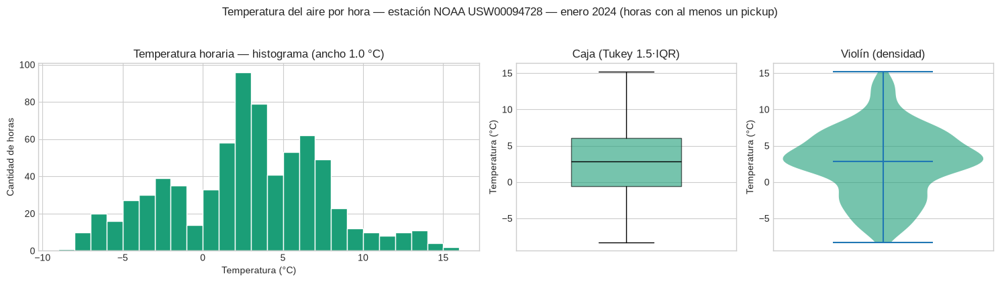

Ancho de barra elegido        : 1.0 °C
Ancho sugerido Freedman-Diaconis: 1.48 °C  (-> 16 barras)
Barras efectivamente dibujadas : 25


In [30]:
# ---------------------------------------------------------------------------
# Distribución de temperatura_c: histograma + boxplot + violín.
# Ancho de barra: 1 °C. Justificación abajo, contrastada con Freedman-Diaconis.
# ---------------------------------------------------------------------------
t = por_hora["temperatura_c"].dropna()
ancho_fd_t = ancho_freedman_diaconis(por_hora["temperatura_c"])
ANCHO_T = 1.0
bordes_t = np.arange(np.floor(t.min()), np.ceil(t.max()) + ANCHO_T, ANCHO_T)

fig, axes = plt.subplots(1, 3, figsize=(15, 4), gridspec_kw={"width_ratios": [2, 1, 1]})

axes[0].hist(t, bins=bordes_t, color="#1b9e77", edgecolor="white")
axes[0].set(title=f"Temperatura horaria — histograma (ancho {ANCHO_T} °C)",
            xlabel="Temperatura (°C)", ylabel="Cantidad de horas")

axes[1].boxplot(t, widths=0.5, patch_artist=True,
                boxprops=dict(facecolor="#1b9e77", alpha=0.6), medianprops=dict(color="black"))
axes[1].set(title="Caja (Tukey 1.5·IQR)", ylabel="Temperatura (°C)", xticks=[])

partes = axes[2].violinplot([t.to_numpy()], showmedians=True, showextrema=True)
for cuerpo in partes["bodies"]:
    cuerpo.set_facecolor("#1b9e77"); cuerpo.set_alpha(0.6)
axes[2].set(title="Violín (densidad)", ylabel="Temperatura (°C)", xticks=[])

fig.suptitle("Temperatura del aire por hora — estación NOAA USW00094728 — enero 2024 "
             "(horas con al menos un pickup)", y=1.04)
plt.tight_layout(); plt.show()

print(f"Ancho de barra elegido        : {ANCHO_T} °C")
print(f"Ancho sugerido Freedman-Diaconis: {ancho_fd_t:.2f} °C  "
      f"(-> {int(np.ceil((t.max()-t.min())/ancho_fd_t))} barras)")
print(f"Barras efectivamente dibujadas : {len(bordes_t)-1}")


**Por qué 1 °C de ancho de barra.** Tres razones, declaradas antes de mirar la forma resultante:

1. **Resolución de la fuente.** GHCNh reporta décimas de grado, así que 1 °C está muy por encima del ruido de medición: cada barra agrupa mediciones genuinamente distintas.
2. **Interpretabilidad.** "Cuántas horas de enero estuvieron entre 3 y 4 °C" es una frase que se lee directamente del gráfico; con un ancho de 0,73 °C o de 2,4 °C habría que hacer cuentas mentales para leerlo.
3. **Contraste con una regla automática.** Freedman–Diaconis (`2·IQR/n^(1/3)`) sugiere un ancho parecido al elegido (ver salida de la celda). Que una regla basada en la dispersión y el tamaño de muestra caiga cerca de 1 °C respalda que ese ancho no oculta estructura ni la inventa. En la alternativa de **ancho de barra** (sección 9) se repite el histograma con anchos alternativos para ver qué cambia.

**Qué facilita comparar este gráfico.** El histograma muestra dónde se concentran las horas del mes y si hay una o varias modas; la caja resume la mitad central y marca de una sola mirada los candidatos de Tukey; el violín agrega la forma completa de la densidad, que la caja por sí sola no deja ver (una caja no distingue una distribución de una sola joroba de una de dos).


**Lectura de la distribución de `temperatura_c`** (743 horas válidas de 744; enero 2024; estación NY City Central Park):

- **Centro.** La mediana es **2,8 °C** y la media **2,74 °C**. Que estén tan cerca (diferencia de −0,06 °C) indica que ningún puñado de horas extremas está arrastrando el promedio: en esta variable, media y mediana cuentan la misma historia.
- **Dispersión.** El IQR va de **−0,6 °C a 6,1 °C** (6,7 °C de ancho) y el desvío estándar es **4,76 °C**. La mitad central de las horas de enero se movió en una franja de menos de 7 grados, pero el recorrido completo fue de **23,5 °C** (de −8,3 °C a 15,2 °C): enero no fue un mes térmicamente homogéneo.
- **Forma.** El histograma tiene una moda clara en **2–3 °C** (96 horas) y un **hombro frío** entre −4 y −2 °C. No es una campana simétrica: se parece más a la mezcla de dos situaciones, un régimen templado dominante y episodios fríos bien marcados. La cola cálida (12–15 °C) es corta pero real.
- **Bajo cero.** **192 horas (25,8 %)** estuvieron por debajo de 0 °C. Este dato importa para lo que sigue: en una cuarta parte del mes el aire estuvo por debajo del punto de congelación.
- **Ceros.** Hay **18 horas con exactamente 0,0 °C (2,4 %)**. Como se anticipó, son mediciones reales del punto de congelación, no faltantes disfrazados; conviven con humedades de entre 38 % y 66 %, o sea que se comportan como cualquier otra hora.
- **Dominio.** **Ningún** valor cae fuera del rango físicamente plausible [−25, 25] °C, y hay 136 valores distintos, consistente con una medición en décimas de grado promediada por hora.


### 6.B — Columna 2: `humedad_relativa`

**Qué representa.** La humedad relativa del aire medida por la **misma** estación `USW00094728`, en **porcentaje (%)**: cuánto vapor de agua contiene el aire respecto del máximo que podría contener a esa temperatura. Es una razón, no una cantidad absoluta de agua: el mismo contenido de vapor da humedades relativas distintas según la temperatura.

**Cómo llegó hasta acá (linaje).** Exactamente el mismo camino que `temperatura_c`: `mean` subhorario en el notebook base y `first` en la vista H.

**Dominio esperado.** Por definición, **[0, 100] %**. Un valor negativo o mayor a 100 sería imposible y señalaría un problema de la fuente o del procesamiento. Valores muy cercanos a 100 % son normales con niebla o lluvia.

**Cero vs. faltante.** Acá la lectura se invierte respecto de la temperatura: un **0 % exacto sería sospechoso**, porque implicaría aire absolutamente seco, algo que prácticamente no ocurre en una ciudad costera. Si aparecieran ceros, el primer candidato a explicación sería un código centinela de la fuente y no una medición real.


In [31]:
display(ficha_cobertura(
    por_hora["humedad_relativa"],
    dominio=(0, 100),
    unidad="%",
    agregacion="Sí: mean de las observaciones subhorarias GHCNh dentro de la hora local, "
               "y luego first sobre las zonas (descarta copias replicadas por la unión).",
))
display(resumen_distribucion(por_hora["humedad_relativa"]).to_frame())


,humedad_relativa
unidad de medida,%
tipo de dato físico (dtype),float64
tipo semántico,numérica continua
filas totales (vista H),744
valores válidos,743
valores faltantes (NaN),1
% faltantes,0.13
valores únicos,130
ceros exactos,0
mínimo observado,21.0


,humedad_relativa
n válidos,743.000
mínimo,21.000
Q1,48.000
mediana,59.000
media,62.343
Q3,79.000
máximo,93.000
IQR (Q3-Q1),31.000
desvío estándar,17.531
rango,72.000


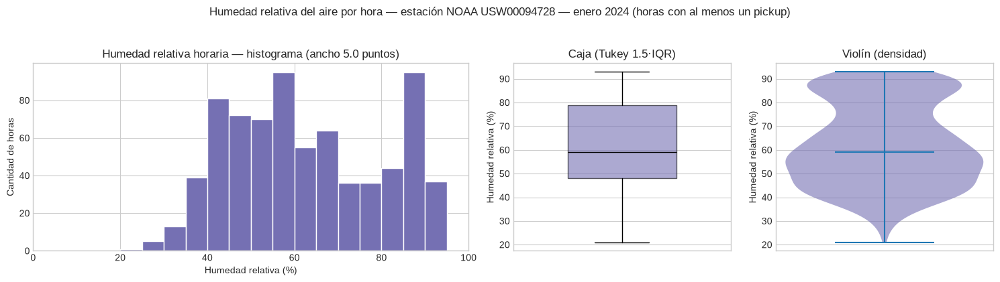

Ancho de barra elegido          : 5.0 puntos porcentuales
Ancho sugerido Freedman-Diaconis: 6.85 puntos (-> 11 barras)
Barras dibujadas sobre el dominio completo [0,100]: 20
Valores exactamente iguales a 100 %: 0 horas
Valores por debajo de 20 %        : 0 horas


In [32]:
# ---------------------------------------------------------------------------
# Distribución de humedad_relativa: histograma + boxplot + violín.
# Ancho de barra: 5 puntos porcentuales. Justificación abajo.
# ---------------------------------------------------------------------------
h = por_hora["humedad_relativa"].dropna()
ancho_fd_h = ancho_freedman_diaconis(por_hora["humedad_relativa"])
ANCHO_H = 5.0
bordes_h = np.arange(0, 100 + ANCHO_H, ANCHO_H)

fig, axes = plt.subplots(1, 3, figsize=(15, 4), gridspec_kw={"width_ratios": [2, 1, 1]})

axes[0].hist(h, bins=bordes_h, color="#7570b3", edgecolor="white")
axes[0].set(title=f"Humedad relativa horaria — histograma (ancho {ANCHO_H} puntos)",
            xlabel="Humedad relativa (%)", ylabel="Cantidad de horas", xlim=(0, 100))

axes[1].boxplot(h, widths=0.5, patch_artist=True,
                boxprops=dict(facecolor="#7570b3", alpha=0.6), medianprops=dict(color="black"))
axes[1].set(title="Caja (Tukey 1.5·IQR)", ylabel="Humedad relativa (%)", xticks=[])

partes = axes[2].violinplot([h.to_numpy()], showmedians=True, showextrema=True)
for cuerpo in partes["bodies"]:
    cuerpo.set_facecolor("#7570b3"); cuerpo.set_alpha(0.6)
axes[2].set(title="Violín (densidad)", ylabel="Humedad relativa (%)", xticks=[])

fig.suptitle("Humedad relativa del aire por hora — estación NOAA USW00094728 — enero 2024 "
             "(horas con al menos un pickup)", y=1.04)
plt.tight_layout(); plt.show()

print(f"Ancho de barra elegido          : {ANCHO_H} puntos porcentuales")
print(f"Ancho sugerido Freedman-Diaconis: {ancho_fd_h:.2f} puntos "
      f"(-> {int(np.ceil((h.max()-h.min())/ancho_fd_h))} barras)")
print(f"Barras dibujadas sobre el dominio completo [0,100]: {len(bordes_h)-1}")
print(f"Valores exactamente iguales a 100 %: {(h == 100).sum()} horas")
print(f"Valores por debajo de 20 %        : {(h < 20).sum()} horas")


**Por qué 5 puntos porcentuales de ancho.** Igual que antes, decidido por criterio y contrastado con la regla automática:

1. **El eje se dibuja sobre el dominio completo [0, 100] %**, no sobre el rango observado. Así el gráfico muestra también *dónde no hay datos*, que es información: si la humedad nunca bajó de cierto valor, eso tiene que verse.
2. **20 barras sobre 100 puntos** es una resolución que deja leer la forma sin fragmentarla en ruido; con 1 punto de ancho el histograma se vuelve un peine irregular gobernado por el redondeo de la estación.
3. La sugerencia de Freedman–Diaconis se imprime arriba para contraste. Si difiere del ancho elegido, la diferencia se explora en la alternativa de **ancho de barra**, no se resuelve cambiando la decisión a mitad de camino.

**Qué facilita comparar este gráfico.** Muestra si las horas de enero se agrupan en un rango estrecho de humedad o si la variable recorre buena parte de su dominio, y —comparado con el gráfico de temperatura— si las dos variables tienen formas de distribución parecidas o distintas. La asimetría hacia valores altos, si aparece, se lee mejor en el violín que en la caja.


**Lectura de la distribución de `humedad_relativa`** (743 horas válidas de 744; mismo periodo y estación):

- **Centro y dispersión.** Mediana **59 %**, media **62,3 %**. Acá la media queda **3,3 puntos por encima** de la mediana: hay más masa estirada hacia los valores altos que hacia los bajos. El IQR es enorme comparado con el de la temperatura en términos relativos: **48 % a 79 %**, o sea **31 puntos** de ancho, con un desvío estándar de **17,5 puntos**.
- **Forma: la distribución es claramente bimodal.** Hay dos picos de igual altura, uno en **55–60 %** (95 horas) y otro en **85–90 %** (95 horas), separados por un valle en **70–80 %** (36 horas en cada barra). Esta es la observación más importante del EDA univariado y **no se ve en ningún estadístico de resumen**: la mediana de 59 % cae sobre uno de los dos picos y no representa un "valor típico" del mes, porque el mes tuvo dos regímenes distintos. Es exactamente el caso que justifica mirar el histograma y el violín antes de resumir con un número.
- **Colas y bordes.** El mínimo es **21 %** y el máximo **93 %**. **Ninguna** hora llegó a 100 % ni superó 95 %, y **ninguna** bajó de 20 %. **176 horas (23,7 %)** estuvieron en 80 % o más; **58 horas (7,8 %)** por debajo de 40 %.
- **Ceros.** **Cero horas con 0 %**, que es lo esperable y lo tranquilizador: como se había anticipado, un 0 % habría sido sospechoso de código centinela más que una medición real. Su ausencia es evidencia de que la columna no está contaminada por ese tipo de artefacto.
- **Dominio.** Ningún valor fuera de [0, 100] %. La variable respeta su definición en las 743 horas válidas.


### 6.C — Cobertura temporal de ambas columnas

Aunque CM-01 no es un par de vista T, las dos columnas están indexadas por hora, y la consigna pide distinguir **hueco** de **faltante** y de **cero**. El gráfico siguiente dibuja las dos series sobre la grilla completa de horas del calendario: donde no hay dato, la línea se **interrumpe**; no se rellena nada.


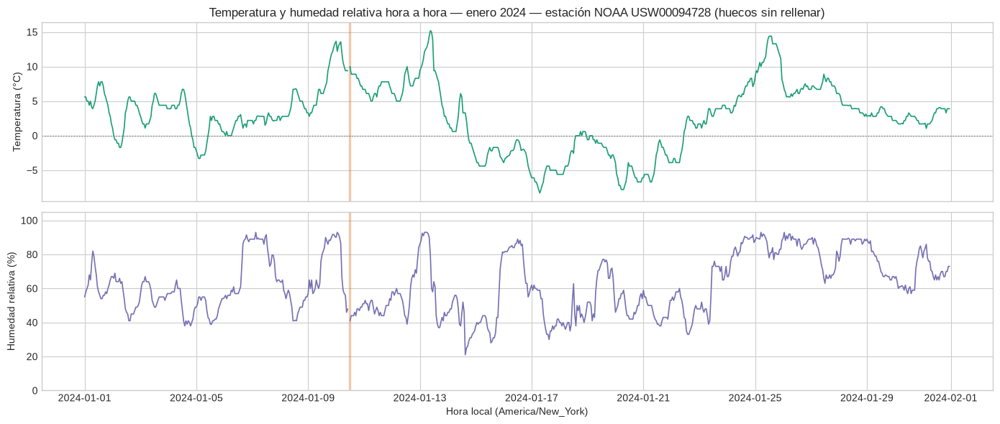

Horas de la grilla sin temperatura (franjas naranjas): 1 de 744


,desde,hasta,horas
0,2024-01-10 11:00:00-05:00,2024-01-10 11:00:00-05:00,1


In [33]:
fig, axes = plt.subplots(2, 1, figsize=(14, 6), sharex=True)

axes[0].plot(serie_horaria.index, serie_horaria["temperatura_c"], color="#1b9e77", linewidth=1.2)
axes[0].axhline(0, color="grey", linestyle=":", linewidth=1)
axes[0].set(ylabel="Temperatura (°C)",
            title="Temperatura y humedad relativa hora a hora — enero 2024 — "
                  "estación NOAA USW00094728 (huecos sin rellenar)")

axes[1].plot(serie_horaria.index, serie_horaria["humedad_relativa"], color="#7570b3", linewidth=1.2)
axes[1].set(ylabel="Humedad relativa (%)", xlabel="Hora local (America/New_York)", ylim=(0, 105))

for ax in axes:
    for hora_faltante in serie_horaria.index[serie_horaria["temperatura_c"].isna()]:
        ax.axvspan(hora_faltante, hora_faltante + pd.Timedelta("1h"), color="#d95f02", alpha=0.25)
plt.tight_layout(); plt.show()

huecos = serie_horaria["temperatura_c"].isna()
print(f"Horas de la grilla sin temperatura (franjas naranjas): {int(huecos.sum())} de {len(serie_horaria)}")
if huecos.any():
    bloques = (huecos != huecos.shift()).cumsum()[huecos]
    detalle_huecos = (
        serie_horaria.index.to_series()[huecos].groupby(bloques)
        .agg(desde="min", hasta="max", horas="size")
    )
    display(detalle_huecos.reset_index(drop=True))
else:
    print("No hay ningún hueco: la cobertura horaria es completa.")


**Qué facilita comparar este gráfico.** Permite ver de una sola pasada tres cosas que las tablas no muestran: (i) si la cobertura es continua o tiene tramos vacíos —marcados en naranja—; (ii) el recorrido del mes, es decir, si hubo episodios fríos y templados alternados o una tendencia sostenida; y (iii) si los dos paneles se mueven en espejo (cuando uno sube el otro baja) o de forma independiente. Esa lectura visual es la que después se cuantifica en la sección 8; mirarla antes evita interpretar un coeficiente sin saber de qué forma viene.


**Lectura de la cobertura temporal.** Las tres situaciones que la consigna pide distinguir se separan limpiamente en este mes:

| Situación | Cuántas | Qué significa |
|---|---|---|
| **Ausencia de fila** | **0 de 744** | Las 744 horas del calendario de enero tienen fila en la vista H. Es decir: **no hubo ni una sola hora del mes sin al menos un pickup válido** en alguna zona. La restricción "solo horas con pickups" no recortó nada en enero, aunque sí define la población y podría recortar en otro periodo. |
| **Faltante (`NaN`)** | **1 hora** | El **10 de enero a las 11:00** no tiene observación de NOAA. Esa hora **sí** tiene actividad de taxis: 4.843 pickups repartidos en 131 zonas. Lo que falta es el dato meteorológico, no la hora. |
| **Cero real** | **18 horas** en temperatura | Mediciones de 0,0 °C, tratadas como el valor numérico que son. |

Que la única hora faltante tenga casi 5.000 pickups es la mejor ilustración de por qué **faltante ≠ cero ≠ ausencia de fila**: si se hubiera rellenado ese `NaN` con un 0, se habría inventado una hora a temperatura de congelación y con humedad nula —físicamente absurda— en medio de un día templado.

**Qué se lee en la serie.** El mes no tiene una tendencia sostenida sino **alternancia de episodios de varios días**: irrupciones frías (las más marcadas alrededor del **17 y el 20 de enero**, con medias diarias de −5,9 °C y −6,1 °C) intercaladas con episodios templados (el **25 de enero** promedió 11,7 °C). Y —esto es lo que anticipa la sección 8— los paneles **no** se mueven en espejo: los días fríos son también los de humedad relativa más baja (49,5 % el 20 de enero) y el día más cálido es el más húmedo (85,4 % el 25 de enero). La franja naranja de la única hora sin dato es tan angosta que hay que buscarla: la cobertura meteorológica del mes es prácticamente completa (99,87 %).


## 7. Casos potencialmente anómalos

**Regla declarada.** Se usa la **regla de Tukey con k = 1,5**: se señala como candidato todo valor fuera de

$$[\,Q_1 - 1{,}5 \cdot IQR,\;\; Q_3 + 1{,}5 \cdot IQR\,]$$

Se aplica **por separado a cada columna** sobre la vista H (una fila = una hora), usando los cuartiles calculados sobre las horas válidas de enero. Es importante ser explícito en dos puntos:

- la regla **genera candidatos a revisión, no errores confirmados**. Una hora con temperatura extrema en enero puede ser una noche polar perfectamente real;
- la regla es **descriptiva y depende de la distribución**: si una variable está muy concentrada, señalará muchos valores; si es dispersa, casi ninguno. No es una prueba de nada.

Para cada candidato se reporta valor, fecha, hora, día de la semana y el contexto disponible en la misma fila (la otra variable del par, viento, visibilidad, pickups y zonas activas).


In [34]:
# ---------------------------------------------------------------------------
# Regla de Tukey (k = 1.5) aplicada a cada columna del par por separado.
# ---------------------------------------------------------------------------
K_TUKEY = 1.5
limites = {c: limites_tukey(por_hora[c], K_TUKEY) for c in COLUMNAS_PAR}

tabla_limites = pd.DataFrame(limites, index=["límite inferior", "límite superior"]).T
tabla_limites["Q1"] = [por_hora[c].quantile(0.25) for c in COLUMNAS_PAR]
tabla_limites["Q3"] = [por_hora[c].quantile(0.75) for c in COLUMNAS_PAR]
tabla_limites["IQR"] = tabla_limites["Q3"] - tabla_limites["Q1"]
tabla_limites["dominio esperado"] = ["[-25, 25] °C", "[0, 100] %"]
tabla_limites.index.name = "columna"
display(tabla_limites.round(3))

for c in COLUMNAS_PAR:
    inf, sup = limites[c]
    por_hora[f"candidato_{c}"] = por_hora[c].lt(inf) | por_hora[c].gt(sup)

por_hora["candidato_cualquiera"] = por_hora[[f"candidato_{c}" for c in COLUMNAS_PAR]].any(axis=1)

conteo = pd.DataFrame({
    "horas válidas": [int(por_hora[c].notna().sum()) for c in COLUMNAS_PAR],
    "candidatos Tukey": [int(por_hora[f"candidato_{c}"].sum()) for c in COLUMNAS_PAR],
}, index=COLUMNAS_PAR)
conteo["% de las horas válidas"] = (100 * conteo["candidatos Tukey"] / conteo["horas válidas"]).round(2)
conteo.index.name = "columna"
display(conteo)
print(f"Horas señaladas por al menos una de las dos reglas: "
      f"{int(por_hora['candidato_cualquiera'].sum())} de {len(por_hora)}")


,límite inferior,límite superior,Q1,Q3,IQR,dominio esperado
columna,,,,,,
temperatura_c,-10.65,16.15,-0.6,6.1,6.7,"[-25, 25] °C"
humedad_relativa,1.50,125.50,48.0,79.0,31.0,"[0, 100] %"


,horas válidas,candidatos Tukey,% de las horas válidas
columna,,,
temperatura_c,743,0,0.0
humedad_relativa,743,0,0.0


Horas señaladas por al menos una de las dos reglas: 0 de 744


In [35]:
# ---------------------------------------------------------------------------
# Tabla de casos señalados, con fecha, hora, día de la semana y contexto.
# ---------------------------------------------------------------------------
DIAS_ES = {"Monday": "lunes", "Tuesday": "martes", "Wednesday": "miércoles", "Thursday": "jueves",
           "Friday": "viernes", "Saturday": "sábado", "Sunday": "domingo"}

candidatos = por_hora.loc[por_hora["candidato_cualquiera"]].copy()
candidatos["fecha"] = candidatos["pickup_hora"].dt.date
candidatos["hora_dia"] = candidatos["pickup_hora"].dt.hour
candidatos["dia_semana"] = candidatos["pickup_hora"].dt.day_name().map(DIAS_ES)
candidatos["motivo"] = np.select(
    [candidatos["candidato_temperatura_c"] & candidatos["candidato_humedad_relativa"],
     candidatos["candidato_temperatura_c"]],
    ["ambas", "temperatura_c"], default="humedad_relativa")
candidatos["viola_dominio"] = (
    candidatos["temperatura_c"].lt(-25) | candidatos["temperatura_c"].gt(25)
    | candidatos["humedad_relativa"].lt(0) | candidatos["humedad_relativa"].gt(100)
)

COLUMNAS_TABLA = ["fecha", "hora_dia", "dia_semana", "motivo", "temperatura_c", "humedad_relativa",
                  "viento", "visibilidad", "pickups", "zonas_activas", "viola_dominio"]
print(f"Casos señalados: {len(candidatos)}")
with pd.option_context("display.max_rows", 200):
    display(candidatos[COLUMNAS_TABLA].round(2).reset_index(drop=True))

print("\nCasos que violan el dominio físico de su variable:",
      int(candidatos["viola_dominio"].sum()))
if len(candidatos):
    print("\nDistribución de los casos señalados por día del mes:")
    display(candidatos.groupby(candidatos["pickup_hora"].dt.date).size().rename("horas_señaladas").to_frame().T)


Casos señalados: 0


,fecha,hora_dia,dia_semana,motivo,temperatura_c,humedad_relativa,viento,visibilidad,pickups,zonas_activas,viola_dominio



Casos que violan el dominio físico de su variable: 0


In [36]:
# ---------------------------------------------------------------------------
# Conjunto de horas (declarado de antemano): mismo resumen CON y SIN los casos señalados.
# Los casos NO se eliminan del conjunto de trabajo: se compara el efecto.
# ---------------------------------------------------------------------------
sin_candidatos = por_hora.loc[~por_hora["candidato_cualquiera"]]

comparacion = {}
for c in COLUMNAS_PAR:
    con = resumen_distribucion(por_hora[c])
    sin = resumen_distribucion(sin_candidatos[c])
    tabla = pd.concat([con.rename("con candidatos"), sin.rename("sin candidatos")], axis=1)
    tabla["diferencia"] = (tabla["sin candidatos"] - tabla["con candidatos"]).round(3)
    comparacion[c] = tabla
    print(f"\n=== {c} ===")
    display(tabla)

print(f"\nHoras usadas: con candidatos = {len(por_hora)}, sin candidatos = {len(sin_candidatos)} "
      f"({100*len(sin_candidatos)/len(por_hora):.1f}% del total)")



=== temperatura_c ===


,con candidatos,sin candidatos,diferencia
n válidos,743.000,743.000,0.0
mínimo,-8.300,-8.300,0.0
Q1,-0.600,-0.600,0.0
mediana,2.800,2.800,0.0
media,2.736,2.736,0.0
Q3,6.100,6.100,0.0
máximo,15.200,15.200,0.0
IQR (Q3-Q1),6.700,6.700,0.0
desvío estándar,4.763,4.763,0.0
rango,23.500,23.500,0.0



=== humedad_relativa ===


,con candidatos,sin candidatos,diferencia
n válidos,743.000,743.000,0.0
mínimo,21.000,21.000,0.0
Q1,48.000,48.000,0.0
mediana,59.000,59.000,0.0
media,62.343,62.343,0.0
Q3,79.000,79.000,0.0
máximo,93.000,93.000,0.0
IQR (Q3-Q1),31.000,31.000,0.0
desvío estándar,17.531,17.531,0.0
rango,72.000,72.000,0.0



Horas usadas: con candidatos = 744, sin candidatos = 744 (100.0% del total)


### 7.1. La regla principal no señaló ningún caso: qué se hace entonces

La regla de Tukey con k = 1,5 —la que quedó declarada como **principal**— no marcó **ninguna** hora en ninguna de las dos columnas. Eso no significa "no hay nada raro": significa que ninguna hora se aleja de la mitad central de su propia distribución más de 1,5 IQR. Con `humedad_relativa` el límite superior de Tukey queda incluso **fuera del dominio físico** de la variable (por encima de 100 %), así que por construcción esa regla no podía señalar humedades altas.

Como la regla principal no produce material para revisar, se agregan **tres sondas secundarias**. Hay que ser explícito en algo: estas reglas se definieron **después** de ver que Tukey no marcaba nada. Por eso **no** son el análisis principal ni se usan para justificar ninguna conclusión: responden una pregunta distinta ("¿hay horas llamativas por algún otro criterio?") y se reportan como exploración declarada:

- **R2 — Tukey más sensible (k = 1,0).** Misma lógica, umbral más estricto, para ver si con un criterio más laxo aparece algo.
- **R3 — Saltos entre horas consecutivas.** Un cambio brusco de una hora a la siguiente puede indicar un problema de medición o de agregación más que una condición meteorológica. Se aplica Tukey (k = 1,5) sobre la distribución de `|valor_t − valor_{t−1}|`.
- **R4 — Revisión de dominio y de valores especiales.** Ceros exactos, valores en el borde del dominio y la hora sin dato.


In [37]:
# ---------------------------------------------------------------------------
# R2 — Tukey con k = 1.0 (regla secundaria, declarada como post-hoc).
# ---------------------------------------------------------------------------
K_SECUNDARIO = 1.0
limites_r2 = {c: limites_tukey(por_hora[c], K_SECUNDARIO) for c in COLUMNAS_PAR}
for c in COLUMNAS_PAR:
    inf, sup = limites_r2[c]
    por_hora[f"r2_{c}"] = por_hora[c].lt(inf) | por_hora[c].gt(sup)

tabla_r2 = pd.DataFrame(limites_r2, index=["límite inferior", "límite superior"]).T
tabla_r2["candidatos R2"] = [int(por_hora[f"r2_{c}"].sum()) for c in COLUMNAS_PAR]
tabla_r2.index.name = "columna"
display(tabla_r2.round(2))

# ---------------------------------------------------------------------------
# R3 — Saltos entre horas consecutivas (sobre la grilla completa de 744 horas).
# ---------------------------------------------------------------------------
saltos = serie_horaria[COLUMNAS_PAR].diff().abs()
filas_r3 = []
for c in COLUMNAS_PAR:
    inf_s, sup_s = limites_tukey(saltos[c], 1.5)
    marcados = saltos[c] > sup_s
    filas_r3.append({"columna": c, "umbral de salto (Tukey 1.5)": sup_s,
                     "salto máximo observado": saltos[c].max(),
                     "horas señaladas": int(marcados.sum())})
    por_hora[f"r3_{c}"] = por_hora["pickup_hora"].map(marcados).fillna(False).astype(bool)
display(pd.DataFrame(filas_r3).set_index("columna").round(2))

# ---------------------------------------------------------------------------
# Unión de las sondas secundarias.
# ---------------------------------------------------------------------------
cols_secundarias = [f"r2_{c}" for c in COLUMNAS_PAR] + [f"r3_{c}" for c in COLUMNAS_PAR]
por_hora["candidato_secundario"] = por_hora[cols_secundarias].any(axis=1)
print(f"\nHoras señaladas por alguna sonda secundaria: "
      f"{int(por_hora['candidato_secundario'].sum())} de {len(por_hora)}")


,límite inferior,límite superior,candidatos R2
columna,,,
temperatura_c,-7.3,12.8,28
humedad_relativa,17.0,110.0,0


,umbral de salto (Tukey 1.5),salto máximo observado,horas señaladas
columna,,,
temperatura_c,1.50,4.5,18
humedad_relativa,7.14,25.0,43



Horas señaladas por alguna sonda secundaria: 82 de 744


In [38]:
# ---------------------------------------------------------------------------
# Tabla de casos señalados por las sondas secundarias, con contexto completo.
# ---------------------------------------------------------------------------
secundarios = por_hora.loc[por_hora["candidato_secundario"]].copy()
secundarios["fecha"] = secundarios["pickup_hora"].dt.date
secundarios["hora_dia"] = secundarios["pickup_hora"].dt.hour
secundarios["dia_semana"] = secundarios["pickup_hora"].dt.day_name().map(DIAS_ES)

def motivo_secundario(fila):
    partes = []
    for c in COLUMNAS_PAR:
        if fila[f"r2_{c}"]:
            partes.append(f"R2 {c}")
        if fila[f"r3_{c}"]:
            partes.append(f"R3 salto {c}")
    return " + ".join(partes)

if len(secundarios):
    secundarios["motivo"] = secundarios.apply(motivo_secundario, axis=1)
    secundarios["viola_dominio"] = (
        secundarios["temperatura_c"].lt(-25) | secundarios["temperatura_c"].gt(25)
        | secundarios["humedad_relativa"].lt(0) | secundarios["humedad_relativa"].gt(100))
    with pd.option_context("display.max_rows", 200):
        display(secundarios[COLUMNAS_TABLA[:4] + ["temperatura_c", "humedad_relativa", "viento",
                                                  "visibilidad", "pickups", "zonas_activas",
                                                  "viola_dominio"]].round(2).reset_index(drop=True))
    print("Casos que violan el dominio físico de su variable:",
          int(secundarios["viola_dominio"].sum()))
else:
    print("Ninguna sonda secundaria señaló horas.")


,fecha,hora_dia,dia_semana,motivo,temperatura_c,humedad_relativa,viento,visibilidad,pickups,zonas_activas,viola_dominio
0,2024-01-01,6,lunes,R3 salto humedad_relativa,4.15,74.50,2.05,13.68,1510,142,False
1,2024-01-01,7,lunes,R3 salto humedad_relativa,3.90,82.00,1.50,14.48,1348,140,False
2,2024-01-02,11,martes,R3 salto temperatura_c,3.30,48.00,1.50,16.09,4474,136,False
3,2024-01-03,10,miércoles,R3 salto temperatura_c,4.40,53.00,1.50,16.09,4354,118,False
4,2024-01-05,12,viernes,R3 salto temperatura_c,2.80,39.00,4.10,16.09,5537,126,False
5,2024-01-06,15,sábado,R3 salto humedad_relativa,2.07,73.00,4.77,1.48,6532,105,False
6,2024-01-06,16,sábado,R3 salto humedad_relativa,1.08,86.17,4.28,2.08,6589,97,False
7,2024-01-07,13,domingo,R3 salto humedad_relativa,2.80,84.00,2.85,16.09,4302,106,False
8,2024-01-07,20,domingo,R3 salto humedad_relativa,2.20,67.00,3.60,16.09,3219,90,False
9,2024-01-08,11,lunes,R3 salto temperatura_c + R3 salto humedad_rela...,6.70,41.00,4.10,16.09,4135,133,False


Casos que violan el dominio físico de su variable: 0


In [39]:
# ---------------------------------------------------------------------------
# R4 — Revisión de valores especiales: ceros, bordes del dominio y la hora sin dato.
# ---------------------------------------------------------------------------
print("== temperatura_c: ceros exactos ==")
ceros_temp = por_hora.loc[por_hora["temperatura_c"] == 0,
                          ["pickup_hora", "temperatura_c", "humedad_relativa", "viento", "pickups"]]
print(f"Horas con temperatura exactamente 0.0 °C: {len(ceros_temp)}")
display(ceros_temp.head(20).reset_index(drop=True))
print("Lectura: 0.0 °C es el punto de congelación, una medición REAL y frecuente en enero en "
      "Nueva York. No se trata como faltante ni como error.\n")

print("== humedad_relativa: bordes del dominio ==")
print(f"Horas con humedad = 0 %  : {(por_hora['humedad_relativa'] == 0).sum()}  (sería sospechoso)")
print(f"Horas con humedad = 100 %: {(por_hora['humedad_relativa'] == 100).sum()}")
print(f"Horas con humedad > 95 % : {(por_hora['humedad_relativa'] > 95).sum()}")
print(f"Mínimo observado         : {por_hora['humedad_relativa'].min()} %\n")

print("== la hora sin dato meteorológico ==")
hora_sin_clima = por_hora.loc[por_hora["temperatura_c"].isna()]
display(hora_sin_clima[["pickup_hora", "pickups", "zonas_activas", "temperatura_c",
                        "humedad_relativa", "viento", "visibilidad"]].reset_index(drop=True))
print("Esa hora SÍ tiene pickups registrados: la zona-hora existe y el taxi funcionó.")
print("Lo que falta es la observación de NOAA. Por eso queda como NaN y no como 0:")
print("no se sabe qué temperatura hubo, no es que la temperatura haya sido cero.")
print("Decisión: se conserva la fila y se excluye por pares (pairwise) solo del cálculo bivariado.")


== temperatura_c: ceros exactos ==
Horas con temperatura exactamente 0.0 °C: 18


,pickup_hora,temperatura_c,humedad_relativa,viento,pickups
0,2024-01-02 01:00:00-05:00,0.0,66.0,0.0,410
1,2024-01-02 09:00:00-05:00,0.0,59.0,1.5,3892
2,2024-01-04 20:00:00-05:00,0.0,40.0,4.1,6290
3,2024-01-05 10:00:00-05:00,0.0,43.0,NaN,5120
4,2024-01-06 01:00:00-05:00,0.0,56.0,1.5,2740
5,2024-01-06 03:00:00-05:00,0.0,56.0,1.5,1198
6,2024-01-06 04:00:00-05:00,0.0,56.0,0.0,638
7,2024-01-06 05:00:00-05:00,0.0,56.0,0.0,405
8,2024-01-06 06:00:00-05:00,0.0,59.0,0.0,786
9,2024-01-18 14:00:00-05:00,0.0,38.0,1.5,6237


Lectura: 0.0 °C es el punto de congelación, una medición REAL y frecuente en enero en Nueva York. No se trata como faltante ni como error.

== humedad_relativa: bordes del dominio ==
Horas con humedad = 0 %  : 0  (sería sospechoso)
Horas con humedad = 100 %: 0
Horas con humedad > 95 % : 0
Mínimo observado         : 21.0 %

== la hora sin dato meteorológico ==


,pickup_hora,pickups,zonas_activas,temperatura_c,humedad_relativa,viento,visibilidad
0,2024-01-10 11:00:00-05:00,4843,131,NaN,NaN,NaN,NaN


Esa hora SÍ tiene pickups registrados: la zona-hora existe y el taxi funcionó.
Lo que falta es la observación de NOAA. Por eso queda como NaN y no como 0:
no se sabe qué temperatura hubo, no es que la temperatura haya sido cero.
Decisión: se conserva la fila y se excluye por pares (pairwise) solo del cálculo bivariado.


In [40]:
# ---------------------------------------------------------------------------
# Conjunto de horas, versión ampliada: resúmenes y correlaciones CON y SIN los candidatos secundarios.
# Los casos NO se borran del conjunto de trabajo.
# ---------------------------------------------------------------------------
sin_secundarios = por_hora.loc[~por_hora["candidato_secundario"]]

for c in COLUMNAS_PAR:
    tabla = pd.concat([resumen_distribucion(por_hora[c]).rename("con todos"),
                       resumen_distribucion(sin_secundarios[c]).rename("sin candidatos secundarios")],
                      axis=1)
    tabla["diferencia"] = (tabla["sin candidatos secundarios"] - tabla["con todos"]).round(3)
    print(f"\n=== {c} ===")
    display(tabla)

print(f"\nHoras: con todos = {len(por_hora)}, sin candidatos secundarios = {len(sin_secundarios)} "
      f"({100*len(sin_secundarios)/len(por_hora):.1f}%)")



=== temperatura_c ===


,con todos,sin candidatos secundarios,diferencia
n válidos,743.000,661.000,-82.000
mínimo,-8.300,-7.200,1.100
Q1,-0.600,-0.600,0.000
mediana,2.800,2.800,0.000
media,2.736,2.510,-0.226
Q3,6.100,5.600,-0.500
máximo,15.200,12.500,-2.700
IQR (Q3-Q1),6.700,6.200,-0.500
desvío estándar,4.763,4.327,-0.436
rango,23.500,19.700,-3.800



=== humedad_relativa ===


,con todos,sin candidatos secundarios,diferencia
n válidos,743.000,661.000,-82.000
mínimo,21.000,25.000,4.000
Q1,48.000,48.000,0.000
mediana,59.000,59.000,0.000
media,62.343,61.979,-0.364
Q3,79.000,77.500,-1.500
máximo,93.000,93.000,0.000
IQR (Q3-Q1),31.000,29.500,-1.500
desvío estándar,17.531,17.516,-0.015
rango,72.000,68.000,-4.000



Horas: con todos = 744, sin candidatos secundarios = 662 (89.0%)


### 7.2. Lectura de los casos señalados y decisión

**La regla principal no señaló nada, y eso ya es un resultado.** Con Tukey k = 1,5 los límites quedaron en **[−10,65 ; 16,15] °C** y **[1,5 ; 125,5] %**. El rango observado de temperatura ([−8,3 ; 15,2]) cae **entero** adentro; el de humedad también. Dos observaciones sobre esto:

- En `humedad_relativa` el límite superior de Tukey (**125,5 %**) está **fuera del dominio físico de la variable**. Por construcción, esa regla **no podía** señalar humedades altas: era ciega de ese lado. Es un buen ejemplo de que una regla estadística no sabe nada del significado de la variable y hay que leerla con el dominio en la mano.
- En ambas columnas el IQR es grande respecto del rango total, así que la regla es poco exigente. **Cero candidatos no significa "no hay horas llamativas"**, significa que ninguna hora se aleja de su propia mitad central más de 1,5 IQR.

**Qué mostraron las sondas secundarias** (recordar: definidas **después** de ver el resultado anterior, por lo tanto exploratorias y no usadas para sostener ninguna conclusión):

| Sonda | Señaladas | Qué son |
|---|---|---|
| **R2** Tukey k = 1,0 | 28 horas de temperatura, **0** de humedad | Todas del extremo **cálido** (≥ 12,8 °C), concentradas en dos episodios: 9–10 de enero y 13 de enero. |
| **R3** salto horario, temperatura | 18 horas (umbral 1,50 °C; salto máximo **4,5 °C** en una hora) | Cambios bruscos de una hora a la siguiente. |
| **R3** salto horario, humedad | 43 horas (umbral 7,14 puntos; salto máximo **25 puntos** en una hora) | Ídem, en humedad. |
| **Unión** | **82 horas (11,0 %)** | Ninguna viola el dominio de su variable. |

**Explicaciones alternativas para los casos llamativos** (más de una es compatible con los datos):

1. **Meteorología real.** Un salto de 25 puntos de humedad en una hora es exactamente lo que se observa cuando **pasa un frente**: cambia la masa de aire y con ella la humedad, en minutos. Los 28 casos cálidos de R2 no están dispersos al azar sino agrupados en dos episodios de días consecutivos, que es la firma de un **cambio de masa de aire**, no de un error puntual de instrumento.
2. **Artefacto de agregación, no del clima.** Cada valor horario es el **promedio de un número variable de reportes subhorarios**. Si una hora tuvo un solo reporte y la siguiente tuvo cuatro, parte del "salto" puede venir de **cuándo** se midió y **cuántas** veces, no de cuánto cambió el aire. Esta explicación no se puede descartar con los datos disponibles, porque el notebook base no audita la distribución intrahoraria de reportes.
3. **Resolución y redondeo de la fuente.** La humedad viene en valores enteros; saltos de varios puntos entre horas contiguas son en parte discretización.
4. **Nada específico de los taxis.** Ninguno de estos casos se explica por actividad de taxis: son variables meteorológicas de una estación, ajenas al proceso TLC.

**Decisión, con justificación trazable: se conservan todas las horas.** Los motivos:

- **ningún valor viola el dominio físico** de su variable (0 violaciones sobre 744 horas);
- los casos señalados son **coherentes entre sí y con el contexto** (episodios de días consecutivos, no horas sueltas e inexplicables);
- el efecto de excluirlos es **chico y va en la dirección esperada de un recorte de colas**: las **medianas no cambian en ninguna de las dos variables**, la media de temperatura baja 0,23 °C, el máximo pasa de 15,2 °C a 12,5 °C y el desvío estándar baja de 4,76 a 4,33;
- sobre todo: **excluirlos eliminaría justamente los episodios templados y los cambios de masa de aire**, que —como se ve en la sección 8— son el fenómeno que da forma a la relación entre ambas variables. Sería descartar la señal por parecerse a ruido.

La columna `candidato_secundario` queda marcada en `por_hora` para poder repetir cualquier cálculo con y sin esos casos, que es lo que se hace en la sección 9.


## 8. Relación entre las columnas

Las dos columnas son **numéricas**, así que corresponde la sección 8.1: dispersión primero, coeficientes después. El orden importa: un coeficiente resume la relación en un solo número y ese número puede ser el mismo para formas muy distintas. Mirar la nube antes de calcularlo es lo que permite saber si el resumen tiene sentido.

Todo el análisis se hace sobre la **vista H** y sobre las horas con **ambas** columnas presentes. Ninguna observación se elimina automáticamente.


Horas con ambas columnas presentes (denominador del análisis bivariado): 743


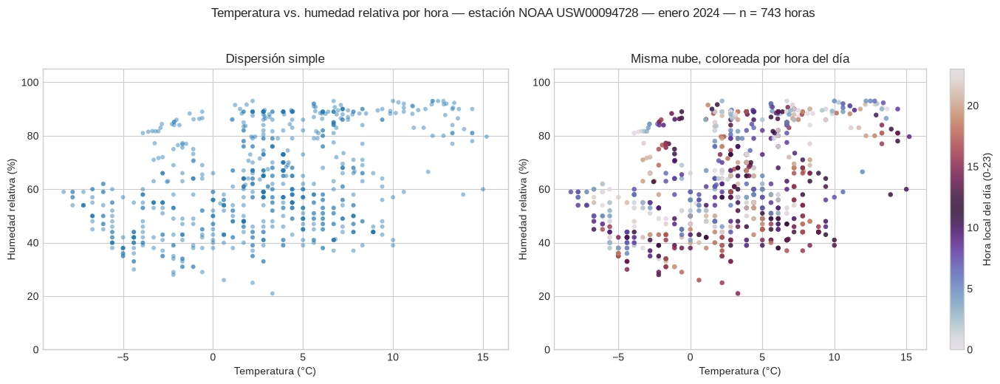

In [41]:
# ---------------------------------------------------------------------------
# 8.1.1 — Diagrama de dispersión. Se colorea por hora del día para poder ver
# si la nube esconde estructura ligada al ciclo diario (overplotting).
# ---------------------------------------------------------------------------
pares = por_hora.dropna(subset=COLUMNAS_PAR).copy()
pares["hora_dia"] = pares["pickup_hora"].dt.hour
print(f"Horas con ambas columnas presentes (denominador del análisis bivariado): {len(pares)}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].scatter(pares["temperatura_c"], pares["humedad_relativa"],
                s=18, alpha=0.45, color="#1f78b4", edgecolor="none")
axes[0].set(xlabel="Temperatura (°C)", ylabel="Humedad relativa (%)",
            title="Dispersión simple", ylim=(0, 105))

dibujo = axes[1].scatter(pares["temperatura_c"], pares["humedad_relativa"],
                         c=pares["hora_dia"], cmap="twilight", s=22, alpha=0.85, edgecolor="none")
axes[1].set(xlabel="Temperatura (°C)", ylabel="Humedad relativa (%)",
            title="Misma nube, coloreada por hora del día", ylim=(0, 105))
fig.colorbar(dibujo, ax=axes[1], label="Hora local del día (0-23)")

fig.suptitle("Temperatura vs. humedad relativa por hora — estación NOAA USW00094728 — "
             f"enero 2024 — n = {len(pares)} horas", y=1.03)
plt.tight_layout(); plt.show()


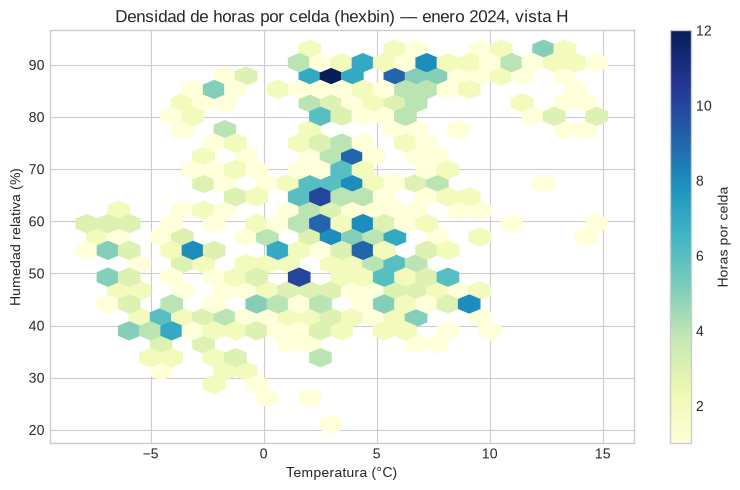

El scatter simple no deja ver cuántas horas hay detrás de cada punto cuando se superponen;
el hexbin responde exactamente esa pregunta: dónde se concentra la masa de horas del mes.


In [42]:
# ---------------------------------------------------------------------------
# 8.1.2 — Superposición de puntos: un hexbin muestra dónde se apilan las horas.
# ---------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(8, 5))
hb = ax.hexbin(pares["temperatura_c"], pares["humedad_relativa"], gridsize=25,
               cmap="YlGnBu", mincnt=1)
ax.set(xlabel="Temperatura (°C)", ylabel="Humedad relativa (%)",
       title="Densidad de horas por celda (hexbin) — enero 2024, vista H")
fig.colorbar(hb, ax=ax, label="Horas por celda")
plt.tight_layout(); plt.show()

print("El scatter simple no deja ver cuántas horas hay detrás de cada punto cuando se superponen;")
print("el hexbin responde exactamente esa pregunta: dónde se concentra la masa de horas del mes.")


In [43]:
# ---------------------------------------------------------------------------
# 8.1.3 — Coeficientes. Se reportan LOS DOS (decisión sobre el coeficiente tomada de antemano).
#   Pearson  : relación LINEAL.
#   Spearman : relación MONOTÓNICA sobre rangos, menos sensible a extremos.
# ---------------------------------------------------------------------------
r_pearson = pearson(por_hora["temperatura_c"], por_hora["humedad_relativa"])
r_spearman = spearman(por_hora["temperatura_c"], por_hora["humedad_relativa"])

pares_sin = sin_candidatos.dropna(subset=COLUMNAS_PAR)
r_pearson_sin = pearson(sin_candidatos["temperatura_c"], sin_candidatos["humedad_relativa"])
r_spearman_sin = spearman(sin_candidatos["temperatura_c"], sin_candidatos["humedad_relativa"])

tabla_corr = pd.DataFrame({
    "n (pares completos)": [len(pares), len(pares_sin)],
    "Pearson (lineal)": [r_pearson, r_pearson_sin],
    "Spearman (monotónica)": [r_spearman, r_spearman_sin],
}, index=["todas las horas", "sin candidatos de Tukey"])
tabla_corr.index.name = "conjunto"
display(tabla_corr.round(4))
print(f"Diferencia Pearson - Spearman (todas las horas): {r_pearson - r_spearman:+.4f}")
print(f"Cambio en Pearson al excluir candidatos        : {r_pearson_sin - r_pearson:+.4f}")
print(f"Cambio en Spearman al excluir candidatos       : {r_spearman_sin - r_spearman:+.4f}")


,n (pares completos),Pearson (lineal),Spearman (monotónica)
conjunto,,,
todas las horas,743,0.3997,0.3701
sin candidatos de Tukey,743,0.3997,0.3701


Diferencia Pearson - Spearman (todas las horas): +0.0296
Cambio en Pearson al excluir candidatos        : +0.0000
Cambio en Spearman al excluir candidatos       : +0.0000


In [44]:
# ---------------------------------------------------------------------------
# 8.1.4 — Puntos influyentes: ¿alguna hora sola mueve el coeficiente?
# Se recalcula Pearson dejando fuera una observación por vez (leave-one-out).
# ---------------------------------------------------------------------------
x = pares["temperatura_c"].to_numpy()
y = pares["humedad_relativa"].to_numpy()
r_total = np.corrcoef(x, y)[0, 1]

deltas = np.empty(len(x))
mascara = np.ones(len(x), dtype=bool)
for i in range(len(x)):
    mascara[i] = False
    deltas[i] = np.corrcoef(x[mascara], y[mascara])[0, 1] - r_total
    mascara[i] = True

pares_influencia = pares.assign(delta_r=deltas)
mas_influyentes = pares_influencia.reindex(
    pares_influencia["delta_r"].abs().sort_values(ascending=False).index
).head(8)

print(f"Pearson con todas las horas: {r_total:.4f}")
print(f"Máximo |cambio| en Pearson al quitar UNA hora: {np.abs(deltas).max():.5f}")
tabla_influencia = mas_influyentes[["pickup_hora", "temperatura_c", "humedad_relativa",
                                   "pickups", "delta_r"]].reset_index(drop=True)
tabla_influencia["pickup_hora"] = tabla_influencia["pickup_hora"].dt.strftime("%Y-%m-%d %H:%M")
display(tabla_influencia.round({"temperatura_c": 2, "humedad_relativa": 2, "delta_r": 4}))


Pearson con todas las horas: 0.3997
Máximo |cambio| en Pearson al quitar UNA hora: 0.00386


,pickup_hora,temperatura_c,humedad_relativa,pickups,delta_r
0,2024-01-12 13:00,10.0,39.00,5494,0.0039
1,2024-01-10 12:00,10.0,41.00,5155,0.0035
2,2024-01-13 07:00,13.4,92.33,1083,-0.0030
3,2024-01-13 06:00,12.8,93.00,681,-0.0030
4,2024-01-13 15:00,8.3,39.00,6290,0.0030
5,2024-01-13 16:00,7.8,37.00,6843,0.0029
6,2024-01-12 12:00,9.4,43.00,5138,0.0029
7,2024-01-13 08:00,14.4,90.00,1866,-0.0029


### 8.1.5. Lectura del análisis bivariado

**Denominador: 743 horas** (las 744 del mes menos la única sin dato NOAA). No se rellenó ni se imputó ningún valor.

| Coeficiente | Valor |
|---|---|
| **Pearson** (lineal) | **+0,400** |
| **Spearman** (monotónica) | **+0,370** |

**Dirección: positiva.** Conviene decirlo con todas las letras, porque **contradice la hipótesis que quedó declarada por escrito en la sección 5**: se anticipaba una asociación **negativa** por la física del aire húmedo (a igual vapor, más temperatura implica menos humedad relativa) y lo que muestran los datos es lo contrario. En enero de 2024, las horas más cálidas tendieron a ser también las **más húmedas**. La hipótesis previa no se corrige ni se borra: se deja escrita y se reporta que los datos no la acompañan.

**Forma.** La nube es ancha y difusa, sin curvatura marcada ni forma de embudo; la relación monotónica y la lineal dan casi lo mismo (diferencia de apenas **0,03**), lo que indica que no hay una curvatura importante que Pearson esté perdiendo ni extremos que lo estén inflando.

**Agrupamientos.** El hexbin muestra que la masa de horas **no está repartida de manera uniforme**: se concentra en dos regiones, una de **aire frío y relativamente seco** (alrededor de 0 °C y 45–55 % de humedad) y otra de **aire templado y muy húmedo** (8–12 °C y 85–90 %). Esos dos focos son la contracara exacta de la **bimodalidad de la humedad** encontrada en 6.B, y son los que le dan forma a la pendiente positiva: no se trata de una nube homogénea que sube en diagonal, sino de **dos regímenes** ubicados en esquinas opuestas.

**Superposición de puntos.** Es considerable: 743 horas sobre valores de humedad enteros y temperaturas en décimas hacen que muchos puntos caigan encima de otros. Por eso el scatter simple se acompaña del hexbin, que es el que permite ver dónde está realmente la masa.

**Puntos influyentes: no hay.** Recalculando Pearson dejando fuera una hora por vez, el mayor cambio posible es **0,0039**. Ninguna hora individual sostiene el resultado; el coeficiente describe el conjunto y no un caso particular.

**Magnitud, dicha con cuidado.** Un Pearson de 0,40 corresponde a un r² de aproximadamente **0,16**: la temperatura acompaña alrededor del **16 % de la variación** de la humedad relativa en estas horas. Dicho al revés, el **84 % restante** se mueve por otros factores. Es una asociación **moderada**, y "moderada" acá quiere decir que sirve para describir el mes, no para predecir la humedad de una hora dada.


### 8.4. Dependencia y explicaciones alternativas

Casi todo el instrumental estadístico habitual supone **observaciones independientes**. Acá ese supuesto **no se cumple**, y conviene medirlo en vez de mencionarlo al pasar. La celda siguiente calcula la **autocorrelación de retardo 1** de cada serie: cuánto se parece cada hora a la anterior.

Si esa autocorrelación es alta, las 700 y pico de filas de la vista H **no son** 700 y pico de mediciones independientes del clima de enero: son un puñado de episodios meteorológicos muestreados hora a hora. Por eso este trabajo **no reporta valores p ni intervalos de confianza**: cualquiera de los dos sería engañosamente angosto bajo esta estructura de dependencia. El tamaño efectivo que se imprime abajo es una **ilustración** de la magnitud del problema (aproximación clásica de Bartlett), no una corrección aplicada a los resultados.


In [45]:
# ---------------------------------------------------------------------------
# Dependencia temporal: autocorrelación de retardo 1 sobre la grilla horaria.
# ---------------------------------------------------------------------------
serie_t = serie_horaria["temperatura_c"]
serie_h = serie_horaria["humedad_relativa"]
rho_t = serie_t.autocorr(lag=1)
rho_h = serie_h.autocorr(lag=1)

n_pares = len(pares)
n_efectivo = n_pares * (1 - rho_t * rho_h) / (1 + rho_t * rho_h)

print(f"Autocorrelación lag-1 de temperatura_c    : {rho_t:.3f}")
print(f"Autocorrelación lag-1 de humedad_relativa : {rho_h:.3f}")
print(f"Horas con ambas columnas (n nominal)      : {n_pares}")
print(f"Tamaño efectivo aproximado (ilustrativo)  : {n_efectivo:.0f} "
      f"({100*n_efectivo/n_pares:.1f}% del n nominal)")

# Autocorrelación a varios retardos: muestra también el ciclo diario.
retardos = [1, 2, 3, 6, 12, 24, 48, 168]
tabla_acf = pd.DataFrame({
    "retardo (horas)": retardos,
    "temperatura_c": [serie_t.autocorr(lag=k) for k in retardos],
    "humedad_relativa": [serie_h.autocorr(lag=k) for k in retardos],
}).set_index("retardo (horas)").round(3)
display(tabla_acf)


Autocorrelación lag-1 de temperatura_c    : 0.992
Autocorrelación lag-1 de humedad_relativa : 0.975
Horas con ambas columnas (n nominal)      : 743
Tamaño efectivo aproximado (ilustrativo)  : 12 (1.7% del n nominal)


,temperatura_c,humedad_relativa
retardo (horas),,
1,0.992,0.975
2,0.978,0.937
3,0.958,0.896
6,0.888,0.762
12,0.757,0.515
24,0.672,0.262
48,0.453,0.137
168,-0.479,-0.045


### 8.5. Una explicación alternativa que se puede poner a prueba con estos mismos datos

Hay dos mecanismos distintos que pueden mover juntas a la temperatura y a la humedad relativa, y **actúan en direcciones opuestas**:

- **Dentro de un mismo día (ciclo diario).** El contenido de vapor de agua cambia poco entre la madrugada y la tarde, pero la temperatura sube. Como la humedad relativa es una *razón* respecto de la capacidad del aire —que crece con la temperatura—, al calentarse la tarde la humedad relativa **baja**. Este mecanismo predice una relación **negativa**.
- **Entre días distintos (escala sinóptica).** En invierno, el aire cálido llega a Nueva York con flujo del sur o del océano y trae humedad; el aire frío llega del continente y es seco. Este mecanismo predice una relación **positiva**.

El coeficiente global mezcla los dos. Se pueden separar descomponiendo cada variable en (i) el **promedio de su día** y (ii) su **desvío respecto de ese promedio diario**, y correlacionando cada parte por separado. No es un experimento ni identifica causas: es una forma de ver **qué escala temporal domina** el número global.


,unidad,n,Pearson,Spearman
escala temporal,,,,
GLOBAL (sin descomponer),una hora,743,0.400,0.370
ENTRE días,un día (promedio de sus horas),31,0.505,0.523
DENTRO de cada día,una hora (desvío de su día),743,0.067,-0.083


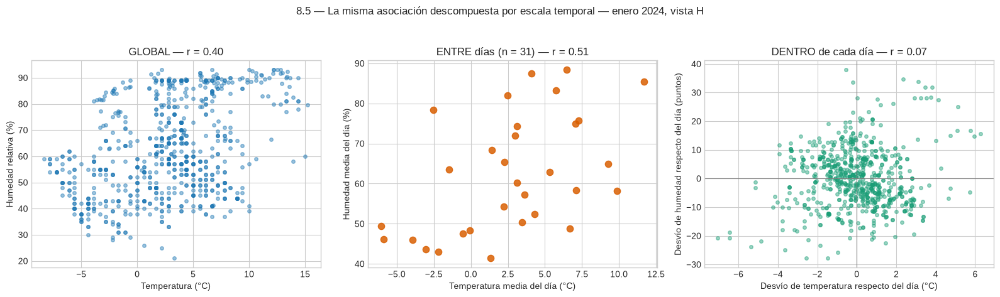

In [46]:
# ---------------------------------------------------------------------------
# Descomposición: variación ENTRE días vs. variación DENTRO de cada día.
# ---------------------------------------------------------------------------
desc = pares.copy()
desc["dia"] = desc["pickup_hora"].dt.date

medias_diarias = desc.groupby("dia")[COLUMNAS_PAR].mean()
r_entre_p = pearson(medias_diarias["temperatura_c"], medias_diarias["humedad_relativa"])
r_entre_s = spearman(medias_diarias["temperatura_c"], medias_diarias["humedad_relativa"])

for c in COLUMNAS_PAR:
    desc[f"anom_{c}"] = desc[c] - desc["dia"].map(medias_diarias[c])
r_intra_p = pearson(desc["anom_temperatura_c"], desc["anom_humedad_relativa"])
r_intra_s = spearman(desc["anom_temperatura_c"], desc["anom_humedad_relativa"])

tabla_desc = pd.DataFrame({
    "unidad": ["una hora", "un día (promedio de sus horas)", "una hora (desvío de su día)"],
    "n": [len(pares), len(medias_diarias), len(desc)],
    "Pearson": [r_pearson, r_entre_p, r_intra_p],
    "Spearman": [r_spearman, r_entre_s, r_intra_s],
}, index=["GLOBAL (sin descomponer)", "ENTRE días", "DENTRO de cada día"])
tabla_desc.index.name = "escala temporal"
display(tabla_desc.round(3))

fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))
axes[0].scatter(pares["temperatura_c"], pares["humedad_relativa"], s=16, alpha=0.45, color="#1f78b4")
axes[0].set(title=f"GLOBAL — r = {r_pearson:.2f}", xlabel="Temperatura (°C)",
            ylabel="Humedad relativa (%)")
axes[1].scatter(medias_diarias["temperatura_c"], medias_diarias["humedad_relativa"],
                s=55, alpha=0.85, color="#d95f02")
axes[1].set(title=f"ENTRE días (n = {len(medias_diarias)}) — r = {r_entre_p:.2f}",
            xlabel="Temperatura media del día (°C)", ylabel="Humedad media del día (%)")
axes[2].scatter(desc["anom_temperatura_c"], desc["anom_humedad_relativa"],
                s=16, alpha=0.45, color="#1b9e77")
axes[2].axhline(0, color="grey", lw=0.8); axes[2].axvline(0, color="grey", lw=0.8)
axes[2].set(title=f"DENTRO de cada día — r = {r_intra_p:.2f}",
            xlabel="Desvío de temperatura respecto del día (°C)",
            ylabel="Desvío de humedad respecto del día (puntos)")
fig.suptitle("8.5 — La misma asociación descompuesta por escala temporal — enero 2024, vista H", y=1.04)
plt.tight_layout(); plt.show()


**Qué comparación facilita esta figura.** Pone lado a lado la **misma** asociación medida en tres unidades distintas, con los mismos datos y sin cambiar ninguna regla. El panel izquierdo es el global (una hora por punto); el central compara **días entre sí** (31 puntos, uno por día de enero); el derecho compara **horas dentro de su propio día**, después de restarle a cada una el promedio de su jornada. Leídos juntos responden algo que el coeficiente global no puede: **a qué escala temporal pertenece la asociación**. Si la nube del panel derecho no tiene pendiente, la relación no es un fenómeno hora a hora.


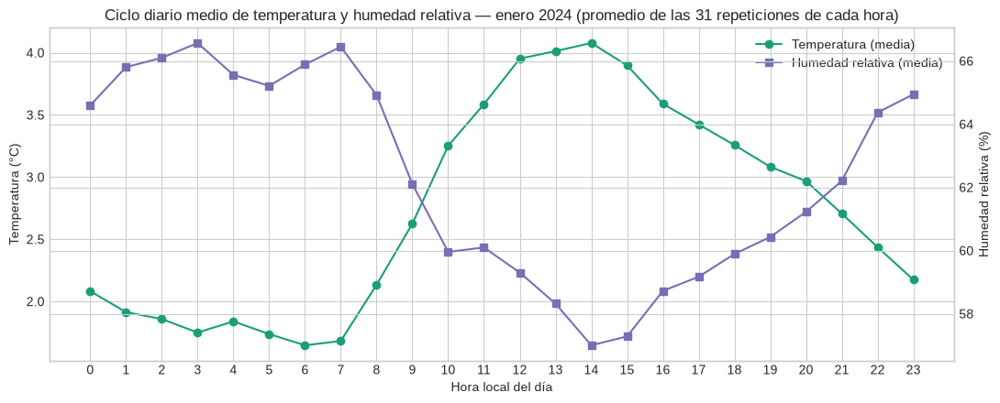

temperatura_c        humedad_relativa       
                  mean median             mean median
hora_dia                                             
0                  2.1    2.2             64.6   59.0
1                  1.9    2.2             65.8   62.0
2                  1.9    2.0             66.1   62.0
3                  1.8    1.7             66.6   60.0
4                  1.8    2.2             65.6   60.0
5                  1.7    1.7             65.2   59.0
6                  1.6    1.8             65.9   60.0
7                  1.7    2.8             66.4   61.0
8                  2.1    2.8             64.9   61.0
9                  2.6    2.8             62.1   59.0
10                 3.3    3.3             60.0   57.0
11                 3.6    3.6             60.1   57.0
12                 4.0    3.9             59.3   58.0
13                 4.0    3.9             58.3   56.0
14                 4.1    4.0             57.0   51.0
15                 3.9    3.9             57.3   53.0
16                 3.6    3.9             58.7   56.0
17                 3.4    3.9             59.2   56.0
18                 3.3    3.3             59.9   58.0
19                 3.1    3.3             60.4   57.0
20                 3.0    3.3             61.2   60.0
21                 2.7    2.8             62.2   62.0
22                 2.4    2.8             64.4   65.0
23                 2.2    2.2             64.9   60.0

In [47]:
# ---------------------------------------------------------------------------
# Perfil medio por hora del día: el ciclo diario de cada variable.
# ---------------------------------------------------------------------------
perfil = pares.groupby("hora_dia")[COLUMNAS_PAR].agg(["mean", "median"])
fig, ax1 = plt.subplots(figsize=(11, 4.5))
ax1.plot(perfil.index, perfil[("temperatura_c", "mean")], color="#1b9e77", marker="o", label="Temperatura (media)")
ax1.set(xlabel="Hora local del día", ylabel="Temperatura (°C)", xticks=range(0, 24))
ax2 = ax1.twinx()
ax2.plot(perfil.index, perfil[("humedad_relativa", "mean")], color="#7570b3", marker="s", label="Humedad relativa (media)")
ax2.set(ylabel="Humedad relativa (%)")
lineas = ax1.get_lines() + ax2.get_lines()
ax1.legend(lineas, [l.get_label() for l in lineas], loc="upper right")
ax1.set_title("Ciclo diario medio de temperatura y humedad relativa — enero 2024 "
              "(promedio de las 31 repeticiones de cada hora)")
plt.tight_layout(); plt.show()
display(perfil.round(1))


**Qué comparación facilita esta figura.** Superpone el ciclo diario medio de las dos variables sobre un mismo eje horario, cada una con su escala (temperatura a la izquierda en °C, humedad a la derecha en %). Cada punto promedia las 31 repeticiones de esa hora del día a lo largo de enero, así que las diferencias entre días se cancelan y queda solo el patrón que se repite a diario. Permite ver si las curvas van **en espejo** —una sube mientras la otra baja— y sobre todo **con qué amplitud**: es lo que separa un mecanismo real pero chico de uno que domina el resultado.


## 9. Análisis de sensibilidad

Se ejecutan las cuatro alternativas **declaradas en la sección 5, antes de conocer ningún resultado**. Las cuatro se reportan completas, den lo que den: elegir cuál mostrar después de ver cuál conviene vaciaría de sentido el ejercicio.

| | Decisión original | Alternativa razonable |
|---|---|---|
| **Coeficiente** | Pearson (relación lineal) | Spearman (relación monotónica, sobre rangos) |
| **Conjunto de horas** | Todas las horas válidas | Excluyendo los candidatos de Tukey |
| **Estratificación** | Una sola relación global | Estratificada por franja horaria del día |
| **Ancho de barra** | 1 °C / 5 puntos | Ancho de Freedman–Diaconis y anchos doble y mitad |

El coeficiente y el conjunto de horas ya están calculados arriba (tabla de correlaciones y comparación de resúmenes). Faltan la estratificación y el ancho de barra.


,n horas,temp. mediana,hum. mediana,Pearson,Spearman
franja,,,,,
madrugada 0-5,186.0,2.2,60.0,0.599,0.589
mañana 6-11,185.0,2.8,59.0,0.423,0.397
tarde 12-17,186.0,3.9,55.5,0.242,0.229
noche 18-23,186.0,2.8,60.0,0.480,0.452
GLOBAL,743.0,2.8,59.0,0.400,0.370


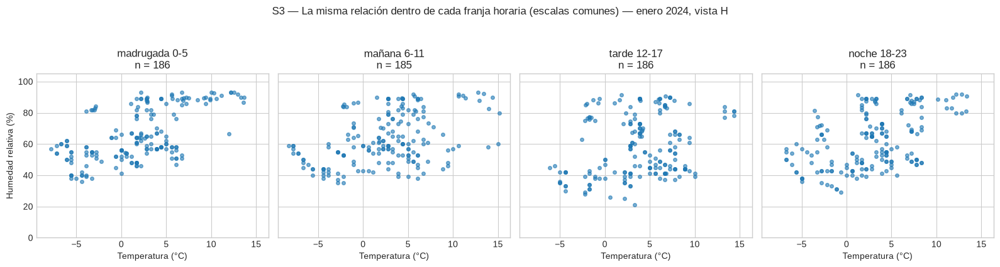

In [48]:
# ---------------------------------------------------------------------------
# Estratificación por franja horaria del día.
# Pregunta: ¿la asociación global se sostiene DENTRO de cada franja, o está
# mezclando el ciclo diario que ambas variables comparten?
# ---------------------------------------------------------------------------
FRANJAS = [(0, 5, "madrugada 0-5"), (6, 11, "mañana 6-11"),
           (12, 17, "tarde 12-17"), (18, 23, "noche 18-23")]

def franja(hora):
    for inicio, fin, etiqueta in FRANJAS:
        if inicio <= hora <= fin:
            return etiqueta
    return "sin clasificar"

pares["franja"] = pares["hora_dia"].map(franja)
orden_franjas = [e for _, _, e in FRANJAS]

filas = []
for etiqueta in orden_franjas:
    sub = pares.loc[pares["franja"] == etiqueta]
    filas.append({
        "franja": etiqueta,
        "n horas": len(sub),
        "temp. mediana": sub["temperatura_c"].median(),
        "hum. mediana": sub["humedad_relativa"].median(),
        "Pearson": pearson(sub["temperatura_c"], sub["humedad_relativa"]),
        "Spearman": spearman(sub["temperatura_c"], sub["humedad_relativa"]),
    })
tabla_franjas = pd.DataFrame(filas).set_index("franja").round(3)
tabla_franjas.loc["GLOBAL"] = [len(pares), pares["temperatura_c"].median(),
                               pares["humedad_relativa"].median(), r_pearson, r_spearman]
display(tabla_franjas.round(3))

fig, axes = plt.subplots(1, 4, figsize=(16, 4), sharex=True, sharey=True)
for ax, etiqueta in zip(axes, orden_franjas):
    sub = pares.loc[pares["franja"] == etiqueta]
    ax.scatter(sub["temperatura_c"], sub["humedad_relativa"], s=16, alpha=0.6, color="#1f78b4")
    ax.set(title=f"{etiqueta}\nn = {len(sub)}", xlabel="Temperatura (°C)")
axes[0].set(ylabel="Humedad relativa (%)", ylim=(0, 105))
fig.suptitle("Estratificación — La misma relación dentro de cada franja horaria (escalas comunes) — "
             "enero 2024, vista H", y=1.05)
plt.tight_layout(); plt.show()


**Qué comparación facilita esta figura.** Las cuatro facetas comparten **exactamente la misma escala** en ambos ejes, así que las nubes se comparan directamente entre sí: cualquier diferencia de posición, pendiente o dispersión es de los datos y no del dibujo. Cada faceta reúne unas 186 horas (una por franja y por día del mes), de modo que dentro de cada panel el momento del día está aproximadamente fijo y lo que varía es **el día**. Permite chequear si la relación positiva aparece en las cuatro franjas o si es el ciclo diario disfrazado.


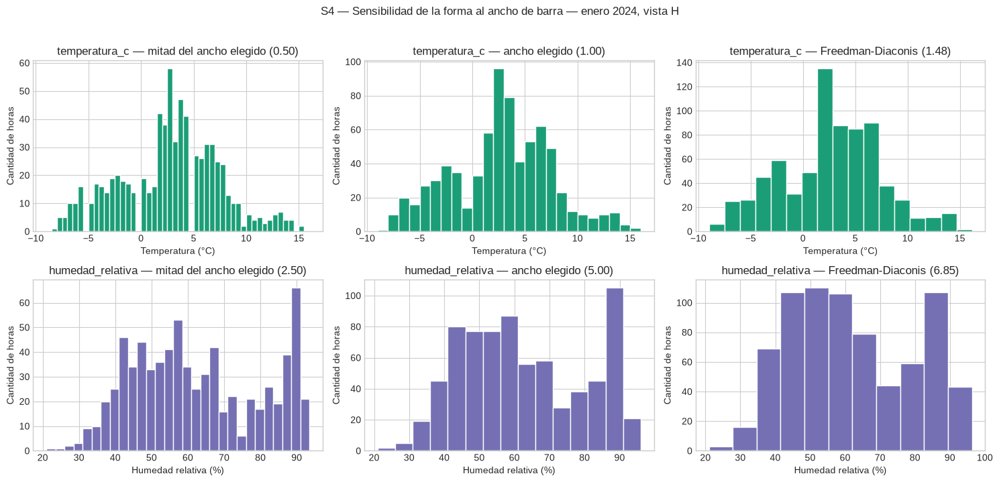

Se compara si la lectura de la forma (una o varias modas, asimetría, colas)
cambia al variar el ancho, o si se mantiene bajo las tres resoluciones.


In [49]:
# ---------------------------------------------------------------------------
# Ancho de los intervalos del histograma.
# ---------------------------------------------------------------------------
fig, axes = plt.subplots(2, 3, figsize=(15, 7))
UNIDAD_EJE = {"temperatura_c": "Temperatura (°C)", "humedad_relativa": "Humedad relativa (%)"}
for fila, (columna, ancho_base, ancho_fd, color) in enumerate([
        ("temperatura_c", ANCHO_T, ancho_fd_t, "#1b9e77"),
        ("humedad_relativa", ANCHO_H, ancho_fd_h, "#7570b3")]):
    serie = por_hora[columna].dropna()
    for col, (ancho, etiqueta) in enumerate([
            (ancho_base / 2, "mitad del ancho elegido"),
            (ancho_base, "ancho elegido"),
            (ancho_fd, "Freedman-Diaconis")]):
        bordes = np.arange(np.floor(serie.min()), np.ceil(serie.max()) + ancho, ancho)
        axes[fila, col].hist(serie, bins=bordes, color=color, edgecolor="white")
        axes[fila, col].set(title=f"{columna} — {etiqueta} ({ancho:.2f})",
                            xlabel=UNIDAD_EJE[columna], ylabel="Cantidad de horas")
fig.suptitle("Sensibilidad de la forma al ancho de barra — enero 2024, vista H", y=1.02)
plt.tight_layout(); plt.show()

print("Se compara si la lectura de la forma (una o varias modas, asimetría, colas)")
print("cambia al variar el ancho, o si se mantiene bajo las tres resoluciones.")


In [50]:
# ---------------------------------------------------------------------------
# Conjunto de horas (continuación): las dos correlaciones excluyendo los candidatos secundarios.
# ---------------------------------------------------------------------------
pares_sin_sec = sin_secundarios.dropna(subset=COLUMNAS_PAR)
tabla_corr_ext = pd.DataFrame({
    "n (pares completos)": [len(pares), len(pares_sin), len(pares_sin_sec)],
    "Pearson": [r_pearson, r_pearson_sin,
                pearson(sin_secundarios["temperatura_c"], sin_secundarios["humedad_relativa"])],
    "Spearman": [r_spearman, r_spearman_sin,
                 spearman(sin_secundarios["temperatura_c"], sin_secundarios["humedad_relativa"])],
}, index=["todas las horas",
          "sin candidatos Tukey k=1.5 (regla principal)",
          "sin candidatos de las sondas secundarias"])
tabla_corr_ext.index.name = "conjunto"
display(tabla_corr_ext.round(4))


,n (pares completos),Pearson,Spearman
conjunto,,,
todas las horas,743,0.3997,0.3701
sin candidatos Tukey k=1.5 (regla principal),743,0.3997,0.3701
sin candidatos de las sondas secundarias,661,0.3711,0.3451


### 9.1. Lectura del análisis de sensibilidad

| | Decisión original | Alternativa | Resultado |
|---|---|---|---|
| **Coeficiente** | Pearson **+0,3997** | Spearman **+0,3701** | Misma dirección, magnitud casi igual (Δ = 0,03). La conclusión **no depende** de qué coeficiente se elija. |
| **Conjunto de horas** | Todas las horas: **0,3997 / 0,3701** | Sin candidatos Tukey k=1,5: **idéntico** (no había ninguno). Sin las 82 horas de las sondas secundarias (n = 661): **0,3711 / 0,3451** | Baja unas 3 centésimas y **mantiene dirección y magnitud**. La asociación **no se apoya en** las horas extremas ni los cambios bruscos. |
| **Estratificación** | Una relación global: **+0,400** | Por franja: madrugada **+0,599**, mañana **+0,423**, tarde **+0,242**, noche **+0,480** | **Positiva en las cuatro franjas.** El resultado **no es un artefacto del ciclo diario**. |
| **Ancho de barra** | Anchos de 1 °C y 5 puntos | Mitad de ancho y Freedman–Diaconis (1,48 °C y 6,85 puntos) | La lectura de la forma **se sostiene**: la bimodalidad de la humedad sigue visible con los tres anchos; con la mitad del ancho aparece dentado por el redondeo de la fuente, y con FD se suaviza sin desaparecer. |

**El detalle más informativo está en la estratificación por franja horaria.** La asociación es **más débil de tarde (+0,24) que de madrugada (+0,60)**, y eso tiene una lectura concreta: la tarde es justamente el momento en que el **ciclo diario** —que empuja en sentido **negativo**, porque el aire se calienta y la humedad relativa cae— es más fuerte y compite con el patrón positivo de fondo. El ciclo diario no borra la asociación, pero la **atenúa** en las horas centrales del día.

**Y la descomposición de 8.5 lo confirma cuantitativamente:**

| Escala | n | Pearson | Spearman |
|---|---|---|---|
| Global (una hora) | 743 | **+0,400** | +0,370 |
| **Entre días** (media diaria) | **31** | **+0,505** | **+0,523** |
| **Dentro de cada día** (desvío respecto de su día) | 743 | **+0,067** | **−0,083** |

Toda la asociación vive en la **variación entre días**, no dentro del día. Comparando días entre sí la relación es más fuerte (+0,51); comparando horas dentro de un mismo día es **prácticamente nula** y con signo ambiguo según el coeficiente (+0,07 en Pearson, −0,08 en Spearman). El perfil horario medio muestra por qué: dentro del día la relación sí es **inversa** —la temperatura media sube de 1,6 °C a las 6 hasta 4,1 °C a las 14, mientras la humedad media baja de 66 % a 57 %—, tal como predecía la hipótesis física, **pero con una amplitud chica** (2,5 °C y 9 puntos) frente a la variación entre días (de −6,1 °C a 11,7 °C de media diaria).

**Conclusión de la sensibilidad:** la dirección positiva del hallazgo es **robusta** a las cuatro alternativas. Lo que **no** es robusto es interpretarla como una relación entre temperatura y humedad "hora a hora": esa lectura se cae apenas se descompone por escala temporal, y el número global corresponde en realidad a un contraste **entre 31 días**, no entre 743 horas independientes.


## 10. Hallazgos finales

Los tres hallazgos usan el vocabulario que corresponde a un análisis exploratorio: **se observa**, **se asocia**, **se relaciona**. No se usa "produce", "provoca", "explica" ni "causa", porque este diseño no permite hablar de causalidad.

---

### Hallazgo 1 — Sobre `temperatura_c`: enero alternó dos regímenes térmicos, no fue un mes uniforme

- **Alcance.** Las 743 horas locales de enero de 2024 con dato meteorológico, en la vista H (una fila = una hora), medidas por la estación NOAA `USW00094728` (NY City Central Park), sobre las horas presentes en `producto`.
- **Observación.** La mediana fue de **2,8 °C** y la media de **2,74 °C**, con IQR de **−0,6 a 6,1 °C**. Pero el recorrido completo fue de **23,5 °C** (mínimo −8,3 °C, máximo 15,2 °C) y **192 horas (25,8 %) estuvieron bajo cero**. El histograma (sección 6.A) muestra una moda en 2–3 °C con un hombro frío entre −4 y −2 °C, y las medias diarias van de **−6,1 °C (20 de enero)** a **+11,7 °C (25 de enero)**: la serie de la sección 6.C muestra esos episodios como bloques de varios días, no como horas sueltas.
- **Cobertura.** 743 valores válidos sobre 744 horas del calendario (**99,87 %**); 1 faltante (10 de enero, 11:00); 0 valores fuera del dominio [−25, 25] °C; 18 horas con 0,0 °C exactos, tratadas como mediciones reales.
- **Interpretación.** Se observa que un solo estadístico de centro **describe mal** este mes: resumir enero con "2,8 °C" oculta que una cuarta parte de sus horas estuvo bajo cero y que hubo días templados de más de 11 °C de media. La dispersión es estructurada en el tiempo (episodios), no ruido hora a hora.
- **Explicación alternativa.** La estructura por bloques podría reflejar en parte el comportamiento de **una única estación** en Central Park —un parque, con su propio microclima— y no el de toda la ciudad; otra parte podría venir de que el promedio horario agrega un número variable de reportes subhorarios.
- **Límite.** Este análisis **no** permite afirmar nada sobre la temperatura en otras zonas de Nueva York, ni sobre otros meses o años, ni establecer una tendencia climática: 31 días de un solo invierno.
- **Siguiente comprobación posible.** Repetir el EDA con **una segunda estación** de la región (por ejemplo LaGuardia o JFK) y comparar las medias diarias, para separar lo que es señal regional de lo que es particularidad de Central Park.

---

### Hallazgo 2 — Sobre `humedad_relativa`: la distribución es bimodal, y por eso la mediana no describe un "valor típico"

- **Alcance.** Las mismas 743 horas de enero de 2024, misma estación, misma vista H.
- **Observación.** Mediana **59 %**, media **62,3 %**, IQR de **48 % a 79 %** (31 puntos), desvío estándar 17,5. El histograma de la sección 6.B muestra **dos picos de igual altura**: uno en **55–60 %** (95 horas) y otro en **85–90 %** (95 horas), separados por un valle en **70–80 %** (36 horas por barra). El **23,7 %** de las horas estuvo en 80 % o más y el **7,8 %** por debajo de 40 %.
- **Cobertura.** 743 válidos sobre 744 (**99,87 %**), 1 faltante; **0 horas con 0 %** (lo que sería sospechoso de código centinela) y **0 horas fuera de [0, 100] %**; mínimo 21 %, máximo 93 %.
- **Interpretación.** Se observa que el mes combinó **dos situaciones distintas** de humedad en proporciones parecidas. La mediana de 59 % cae sobre uno de los dos picos y **no representa** un valor central del mes en ningún sentido útil: cualquier resumen de esta variable que use un solo número está promediando dos regímenes. La lectura correcta es "hubo horas secas y horas muy húmedas, pocas intermedias".
- **Explicación alternativa.** La bimodalidad podría no ser meteorológica: podría venir de un **cambio en el instrumento o en el protocolo de reporte** durante el mes, o de que las horas con más reportes subhorarios (y por lo tanto promedios más suavizados) se concentren en un régimen. Ninguna de estas posibilidades se puede descartar con la información disponible en el notebook base, que no audita la cobertura intrahoraria de GHCNh.
- **Límite.** No se puede afirmar que la ciudad tuvo dos regímenes de humedad: **la humedad relativa depende fuertemente del punto de medición** (proximidad al agua, superficie, altura), y acá hay una sola estación.
- **Siguiente comprobación posible.** Marcar cada hora con el número de observaciones subhorarias que la componen y verificar si los dos picos se distribuyen de manera pareja entre horas con muchos y con pocos reportes; si no lo hicieran, la bimodalidad sería sospechosa de artefacto de medición.

---

### Hallazgo 3 — Sobre la relación: se asocian **positivamente**, y esa asociación vive **entre días**, no dentro del día

- **Alcance.** Las **743 horas** de enero de 2024 con **ambas** columnas presentes, vista H, misma estación. Sin imputaciones ni exclusiones.
- **Observación.** **Pearson +0,400** y **Spearman +0,370**: en enero, las horas más cálidas tendieron a ser también las **más húmedas**. La dispersión y el hexbin (sección 8.1) muestran dos concentraciones en esquinas opuestas: aire frío y seco (≈ 0 °C, 45–55 %) y aire templado y húmedo (8–12 °C, 85–90 %). Al descomponer por escala temporal (sección 8.5): **entre días r = +0,505** (n = 31 días), **dentro de cada día r = +0,067** en Pearson y **−0,083** en Spearman. La asociación se mantiene positiva en las cuatro franjas horarias (+0,24 a +0,60) y ningún punto individual mueve Pearson más de **0,004**.
- **Cobertura.** Denominador **743 de 744** horas del calendario (99,87 %); la única hora excluida lo fue por faltante de NOAA, no por decisión analítica. Sin candidatos de la regla principal de Tukey; excluyendo las 82 horas de las sondas secundarias, los coeficientes pasan a +0,371 y +0,345.
- **Interpretación.** El resultado **contradice la hipótesis declarada de antemano** (se esperaba una asociación negativa por la física del aire húmedo). La lectura que los datos sí sostienen es que en invierno el par se ordena por **masa de aire**: los días fríos de enero fueron días de aire seco (20 de enero: −6,1 °C y 49,5 % de media) y los días templados fueron días de aire húmedo (25 de enero: 11,7 °C y 85,4 %). El mecanismo físico de la hipótesis previa **también aparece**, pero solo **dentro** de cada día —el perfil horario muestra temperatura máxima y humedad mínima a las 14:00— y con una amplitud demasiado chica (2,5 °C y 9 puntos) para dominar el coeficiente global. Es decir: las dos cosas conviven, y el signo global lo decide la escala que más varía.
- **Explicación alternativa.** El patrón puede estar **confundido por la estacionalidad dentro del mes**: si los episodios templados de enero coincidieron con sistemas de baja presión que además traen precipitación y niebla, la humedad alta podría asociarse al **paso de frentes** y no a la temperatura en sí. Otra explicación posible es la **dependencia temporal**: con solo unos pocos episodios meteorológicos en el mes, un puñado de días húmedos y templados alcanza para producir este coeficiente. También es posible que parte del efecto sea de medición: la humedad relativa se calcula a partir de la temperatura, de modo que ambas comparten instrumento y momento de registro.
- **Límite.** Este análisis **no** permite afirmar que la temperatura determine la humedad relativa ni al revés; **no** permite extender el resultado a otros meses (en verano el balance entre los dos mecanismos puede invertirse); **no** permite tratar las 743 horas como observaciones independientes —la autocorrelación de retardo 1 es **0,992** en temperatura y **0,975** en humedad, y el tamaño efectivo aproximado es de apenas **12 observaciones**—; y por eso mismo **no se reportan valores p ni intervalos de confianza**, que serían engañosamente angostos. El coeficiente global corresponde en los hechos a un contraste entre **31 días**, no entre 743 horas.
- **Siguiente comprobación posible.** Repetir la descomposición sobre un periodo más largo y no solapado (por ejemplo febrero a junio, como propone la actividad extra) y comprobar si el signo entre días se mantiene o se invierte al entrar en meses cálidos. Una segunda comprobación, más directa: incorporar el **punto de rocío**, que mide contenido absoluto de vapor; si la asociación positiva entre temperatura y humedad relativa se sostiene tras condicionar por punto de rocío, la explicación por masas de aire pierde fuerza.


## 11. Producto entregado, límites y próximos pasos

### Checklist de la consigna

| Requisito (sección 11 de la consigna) | Dónde está en este notebook |
|---|---|
| Identificación del estudiante y del par elegido | Encabezado de esta sección |
| Ejecución reproducible para enero completo, de punta a punta | `MODO_CLASE = False` en la sección 1 del taller; el notebook corre entero sin errores |
| Declaración previa del análisis | Sección 5, completada **antes** de calcular |
| Construcción y validación de la vista requerida | Sección 2: verificación `nunique <= 1` por hora y construcción de `por_hora` |
| Dos análisis univariados (uno por columna) | Secciones 6.A y 6.B, con ficha de cobertura y distribución |
| Tabla de casos potencialmente anómalos | Sección 7: regla principal declarada + 3 sondas secundarias + decisión trazable |
| Análisis bivariado | Sección 8: dispersión, hexbin, Pearson, Spearman, puntos influyentes, dependencia, descomposición |
| Al menos tres visualizaciones interpretadas | Son **ocho**: histograma+caja+violín de cada variable (2), serie temporal con huecos (1), dispersión simple y coloreada (1), hexbin (1), descomposición por escala (1), perfil horario (1), facetas por franja (1), sensibilidad al ancho de barra (1) |
| Análisis de sensibilidad | Sección 9: las cuatro alternativas, **declaradas en la sección 5 antes de ver resultados** |
| Tres hallazgos finales | Sección 10, con alcance, observación, cobertura, interpretación, explicación alternativa, límite y siguiente comprobación |
| Límites y próximos pasos | Acá abajo |

### Límites que acompañan todo lo anterior

1. **Una sola estación meteorológica.** Todo el trabajo describe `USW00094728` (Central Park). Nada de lo dicho se puede atribuir a "el clima de Nueva York" ni diferenciar por zona o borough. Esta es también la razón por la que la consigna prohíbe cruzar clima con zona sobre `producto`.
2. **Las observaciones no son independientes.** Autocorrelación de retardo 1 de 0,992 y 0,975. Las 743 filas son un puñado de episodios meteorológicos muestreados hora a hora. Por eso no hay valores p, intervalos de confianza ni pruebas de hipótesis en ninguna parte de este trabajo: no serían interpretables bajo esta estructura de dependencia.
3. **La población está definida por los taxis, no por el clima.** La vista H solo contiene horas presentes en `producto`, es decir, horas con al menos un pickup válido de Yellow Taxi. En enero de 2024 esto no recortó nada (las 744 horas estaban), pero la definición sigue siendo esa y en otro periodo podría recortar. Los registros TLC son **viajes realizados y reportados que pasaron las reglas de calidad**: no son demanda, no son solicitudes no atendidas y no son toda la movilidad de la ciudad.
4. **Las variables ya vienen agregadas.** Ambas columnas son promedios de un número **variable** de reportes subhorarios. El notebook base no audita cuántos reportes componen cada hora ni sus banderas de calidad, así que parte de la variabilidad horaria —sobre todo los saltos de R3— puede ser de muestreo y no de atmósfera.
5. **Ningún resultado es causal.** Se describe una asociación en un mes concreto. La dirección observada es contraria a la hipótesis previa y su explicación más plausible involucra una tercera variable no medida (la masa de aire), que es exactamente la definición de una explicación alternativa que este diseño no puede descartar.
6. **Un mes de invierno.** Enero acota el rango de temperatura a [−8,3 ; 15,2] °C. Extrapolar el signo de la asociación a un rango más amplio no está justificado por estos datos.

